In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
from matplotlib.cbook import boxplot_stats

/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/2610648034.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
# colourblind-friendly palette from colour universal design (CUD)
# https://jfly.uni-koeln.de/color/
# https://nanx.me/oneclust/reference/cud.html
named_colors = {
    "black": "#000000",
    "orange": "#e69f00",
    "skyblue": "#56b4e9",
    "bluish green": "#009e73",
    "yellow": "#f0e442",
    "blue": "#0072b2",
    "vermilion": "#d55e00",
    "reddish purple": "#cc79a7",
}
cud_palette = list(named_colors.values())
sns.set_theme(style="whitegrid")

def cud(n: int = len(cud_palette), start: int = 0) -> list[str]:
    remainder = cud_palette[:start]
    palette = cud_palette[start:] + remainder
    return palette[:n]

In [3]:
samplesheet = pd.read_csv("../config/pep/samples.csv", index_col="sample_name")
samplesheet

,species,taxid,reads_dir,reference_path,illumina_1,illumina_2
sample_name,,,,,,
ATCC_10708__202309,Salmonella_enterica,28901,source1,source2,source3,source4
ATCC_17802__202309,Vibrio_parahaemolyticus,670,source1,source2,source3,source4
ATCC_25922__202309,Escherichia_coli,562,source1,source2,source3,source4
ATCC_33560__202309,Campylobacter_jejuni,197,source1,source2,source3,source4
ATCC_35221__202309,Campylobacter_lari,201,source1,source2,source3,source4
ATCC_19119__202309,Listeria_ivanovii,1638,source1,source2,source3,source4
ATCC_35897__202309,Listeria_welshimeri,1643,source1,source2,source3,source4
ATCC_BAA-679__202309,Listeria_monocytogenes,1639,source1,source2,source3,source4
BPH2947__202310,Staphylococcus_aureus,1280,source1,source2,source3,source4


# Assessing self calls

In [4]:
df = pd.read_csv("../results/assess/self/self_calls.csv")
df.sort_values(by=["sample", "caller"], inplace=True)
# shorten model column from dna_r10.4.1_e8.2_400bps_fast@v4.3.0 to fast
df["model"] = df["model"].apply(lambda x: x.split("_")[-1].split("@")[0])
df.head()

FileNotFoundError: [Errno 2] No such file or directory: '../results/assess/self/self_calls.csv'

In [ ]:
# add SNP and INDEL FPR columns
df["seqlen"] = df["FP"] + df["TN"]
df["SNP_FPR"] = df["SNP"] / df["seqlen"]
df["INDEL_FPR"] = df["INDEL"] / df["seqlen"]
df["SNP_FP/Mbp"] = df["SNP"] / df["seqlen"] * 1e6
df["INDEL_FP/Mbp"] = df["INDEL"] / df["seqlen"] * 1e6
df["FP/Mbp"] = df["FP"] / df["seqlen"] * 1e6
df.head()

,SNP,INS,DEL,INDEL,FP,SNP_TN,INDEL_TN,TN,SNP_FPR,INDEL_FPR,...,2bp_hom_ins,3bp_hom_ins,4bp_hom_ins,5+bp_hom_ins,hom_ins,hom_indels,seqlen,SNP_FP/Mbp,INDEL_FP/Mbp,FP/Mbp
9,60,293,704,997,1057,5445072,5444135,5444075,1.101902e-05,0.000183,...,0.023891,0.006826,0.0,0.0,0.921502,0.929789,5445132,11.019017,183.099326,194.118343
23,4,6,32,38,42,5445128,5445094,5445090,7.346011e-07,0.000007,...,0.166667,0.000000,0.0,0.0,1.000000,0.947368,5445132,0.734601,6.978711,7.713312
37,0,0,7,7,7,5445132,5445125,5445125,0.000000e+00,0.000001,...,0.000000,0.000000,0.0,0.0,0.000000,1.000000,5445132,0.000000,1.285552,1.285552
51,191,99,1141,1240,1431,5444941,5443892,5443701,3.507720e-05,0.000228,...,0.010101,0.010101,0.0,0.0,0.757576,0.745968,5445132,35.077203,227.726343,262.803546
65,0,6,221,227,227,5445132,5444905,5444905,0.000000e+00,0.000042,...,0.000000,0.000000,0.0,0.0,0.833333,0.916300,5445132,0.000000,41.688613,41.688613


Print the FPR rate for each sample, stratified into version, mode, model, depth, caller, and sample

In [ ]:
fpr_rate = df.groupby(["version", "mode", "model", "depth", "caller", "sample"]).apply(lambda a: a[:])
with pd.option_context("display.max_rows", None, "display.max_columns", None):
    print(fpr_rate)

fpr_rate.to_latex("self_fpr_rate.tex", index=False, escape=True)
fpr_rate.to_string("self_fpr_rate.txt", index=False)

                                                                    SNP   INS  \
version mode    model depth caller      sample                                  
v4.3.0  duplex  fast  100x  bcftools    AJ292__202310        9       60   293   
                                        AMtb_1__202402       13     147   586   
                                        ATCC_10708__202309   0       24  1260   
                                        ATCC_17802__202309   1       15    60   
                                        ATCC_19119__202309   5        0    12   
                                        ATCC_25922__202309   2       40   124   
                                        ATCC_33560__202309   3      124   520   
                                        ATCC_35221__202309   4       55   333   
                                        ATCC_35897__202309   6        0    31   
                                        ATCC_BAA-679__202309 7        1    10   
                            

In [ ]:
def plot_fpr(df, y, title=""):
    # plot fpr rate for each version, mode, model, depth, and caller
    row = "depth"
    nrows = len(df[row].unique())
    col = "mode"
    ncols = len(df[col].unique())
    hue = "model"
    x = "caller"
    palette = cud(n=len(df[hue].unique()))
    annotated_species = set()
    fig, axes = plt.subplots(
        ncols=ncols,
        nrows=nrows,
        figsize=(10, 10),
        dpi=300,
        squeeze=False,
        sharey=True,
        tight_layout=True,
    )
    legend_drawn = False
    for i, version in enumerate(df[row].unique()):
        version_df = df.query(f"{row} == '{version}'")
        for j, mode in enumerate(version_df[col].unique()):
            mode_df = version_df.query(f"{col} == '{mode}'")
            ax = axes[i, j]
            sns.boxplot(
                x=x,
                y=y,
                data=mode_df,
                ax=ax,
                hue=hue,
                fill=False,
                fliersize=0,
                palette=palette,
                gap=0.2,
            )
            strip = sns.stripplot(
                x=x,
                y=y,
                data=mode_df,
                ax=ax,
                hue=hue,
                dodge=True,
                alpha=0.75,
                legend=False,
                linewidth=0.5,
                edgecolor="black",
                palette=palette,
            )

            for collection_i, collection in enumerate(strip.collections):
                caller_i = math.floor(collection_i / len(df[hue].unique()))  
                caller = mode_df[x].unique()[caller_i]   
                model_i = collection_i % len(df[hue].unique())
                offsets = collection.get_offsets()
                xs = []
                ys = []
                for xval, yval in offsets:
                    xs.append(xval)
                    ys.append(yval)
                
                stats = boxplot_stats(ys)[0]
                whishi = stats["whishi"]
                outliers = [y for y in stats["fliers"] if y > whishi]
                for ix, yval in enumerate(ys):
                    if yval in outliers:
                        # annotate with the name of sample that is an outlier
                        caller_df = mode_df.query(f"{x} == '{caller}'")
                        # get the index of the y value closest to the outlier
                        s_ix = (caller_df[y] - yval).abs().idxmin()
                        sample = caller_df["sample"].loc[s_ix]
                        species = samplesheet["species"].loc[sample]
                        annotated_species.add(species)
                        s = species.split("_")[0][0] + species.split("_")[1][0]
                        ax.annotate(
                            s,
                            (xs[ix], yval),
                            xycoords="data",
                            textcoords="offset points",
                            xytext=(3, 50),
                            ha="left",
                            va="bottom",
                            fontsize=6,
                            arrowprops=dict(arrowstyle="->", lw=1, color=cud()[model_i], relpos=(0, 1)),
                        )



            ax.set_title(f"{mode}")
            if "FPR" in y:
                ax.set_ylabel("FPR")
                ax.set_yscale("symlog", linthresh=0.0000001)
                yticks = [0, 0.00000001, 0.0000001, 0.000001, 0.00001, 0.0001, 0.001, 0.01]
            elif "FP/Mbp" in y:
                ax.set_ylabel("FP/Mbp")
                ax.set_yscale("symlog", linthresh=1)
                yticks = [0, 1, 10, 100, 1000, 10000]
            else:
                ax.set_ylabel(y)
            ax.set_xlabel("Caller")
            
            ax.set_yticks(yticks)
            ax.set_yticklabels(yticks)
            # rotate x labels
            for tick in ax.get_xticklabels():
                tick.set_rotation(90)

            if legend_drawn:
                ax.get_legend().remove()
            else:
                ax.legend(loc="upper right", title=hue)
                legend_drawn = True

    # add a legend for the species initials
    if annotated_species:
        annotated_species = sorted(list(annotated_species))
        abbrevs = [s.split("_")[0][0] + s.split("_")[1][0] for s in annotated_species]
        handles = [
            plt.Line2D([0], [0], marker="o", color="w", markerfacecolor="w", markersize=0)
        ] * len(annotated_species)
        labels = list([f"{a} = $\it{{{s.split('_')[0]}}}$ $\it{{{s.split('_')[1]}}}$" for a, s in zip(abbrevs, annotated_species)])
        axes[0,1].legend(
            handles,
            labels,
            loc="best",
            # title="Species",
            fontsize=6,
        )
                
    fig.suptitle(title, fontsize=16)

    return fig, axes

## Plotting overall FPR

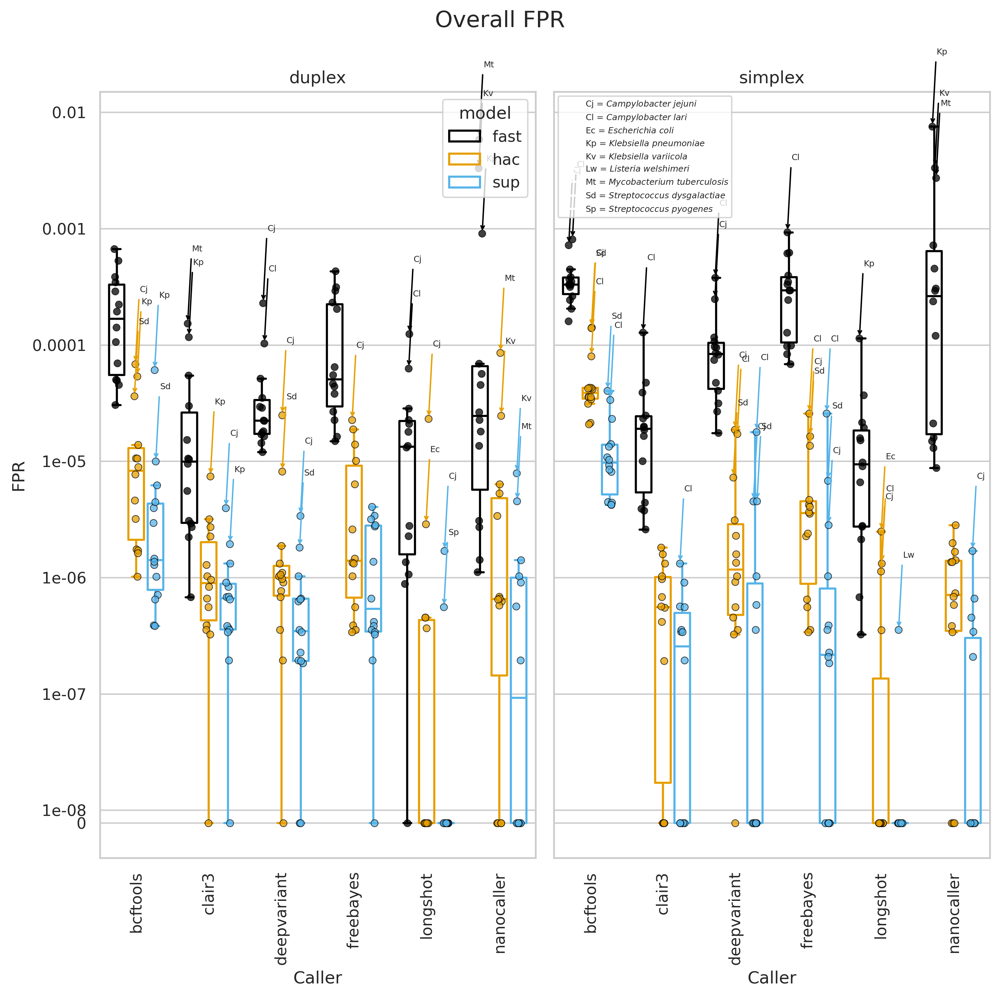

In [ ]:
overall_fig, overall_axes = plot_fpr(df, "FPR", "Overall FPR")

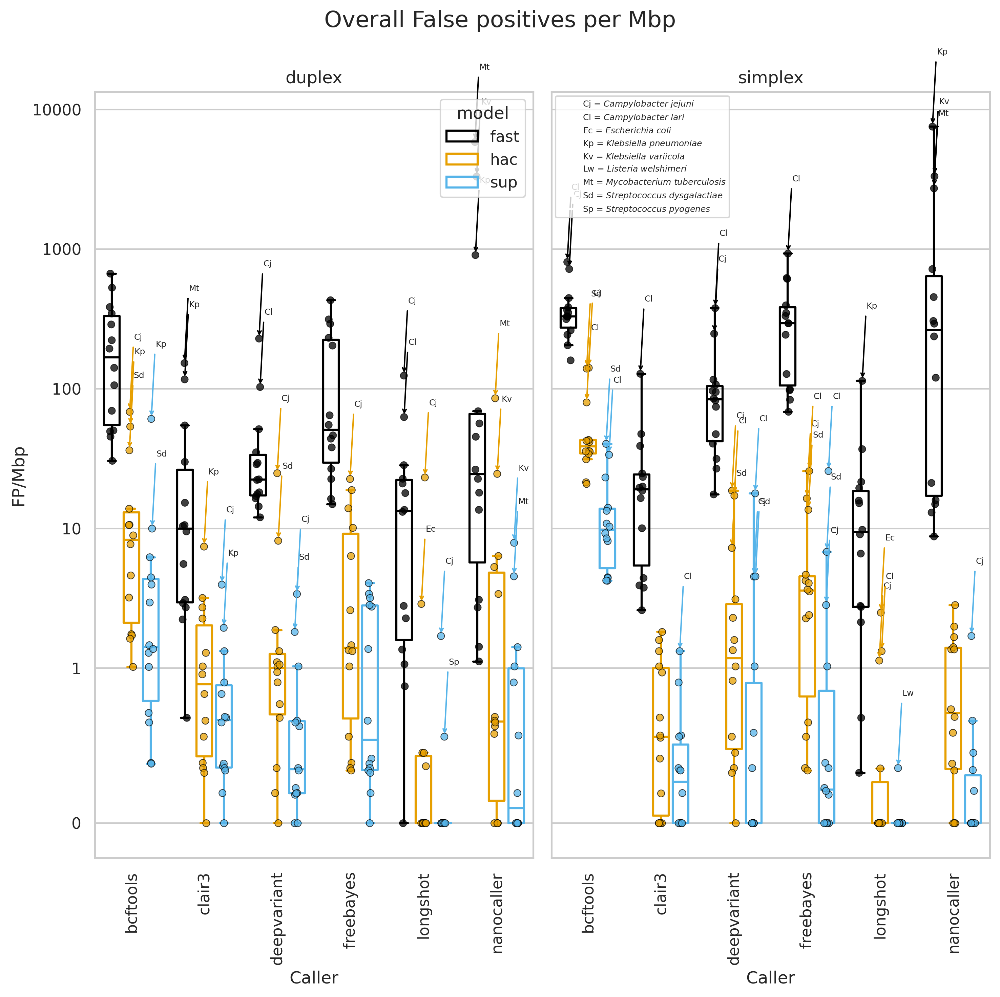

In [ ]:
overall_fig, overall_axes = plot_fpr(df, "FP/Mbp", "Overall False positives per Mbp")

## Plotting SNP FPR

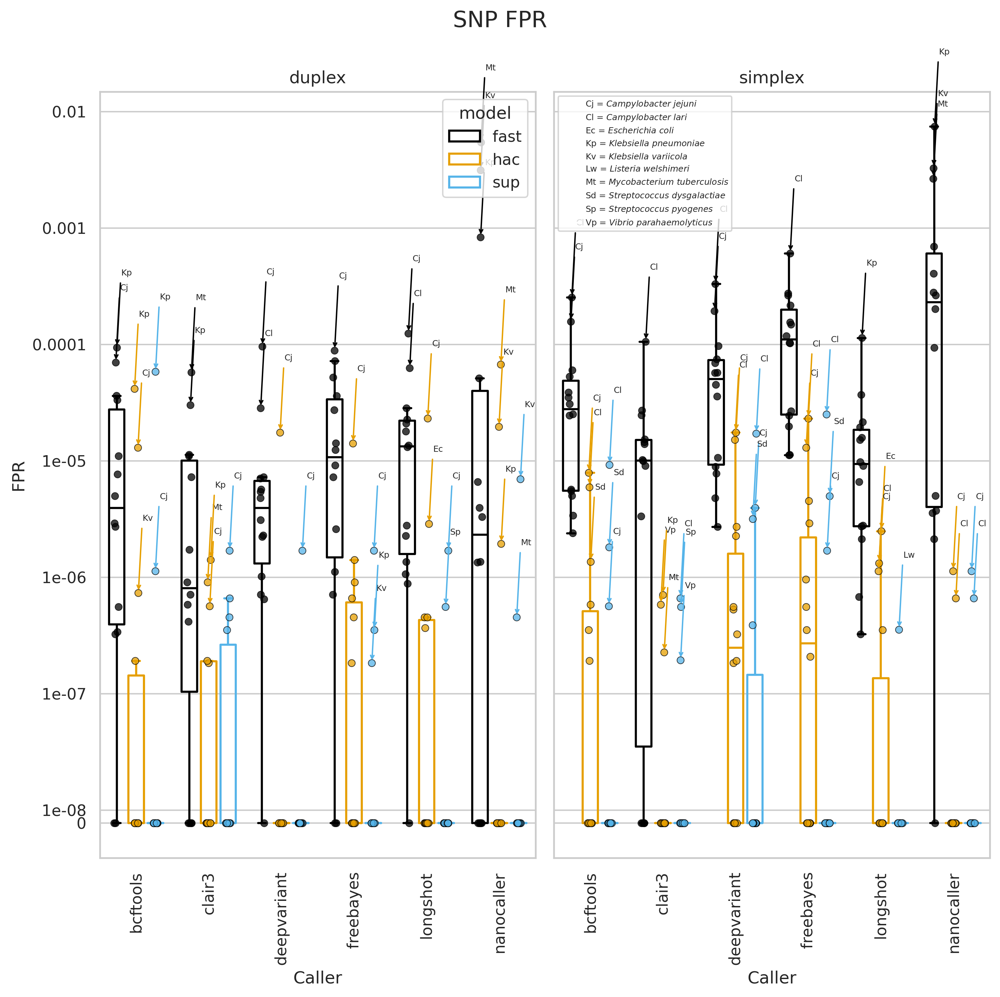

In [ ]:
snp_fig, snp_axes = plot_fpr(df, "SNP_FPR", "SNP FPR")

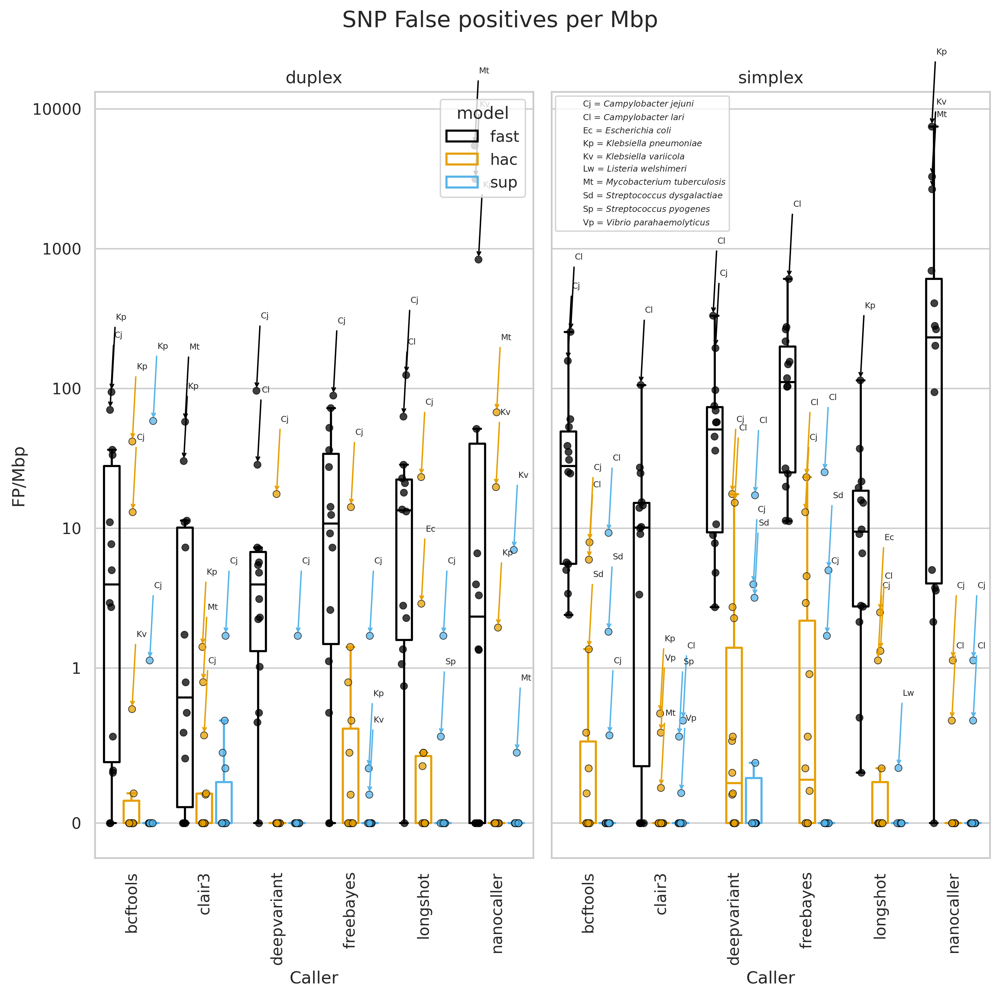

In [ ]:
snp_fig, snp_axes = plot_fpr(df, "SNP_FP/Mbp", "SNP False positives per Mbp")

## Plot INDEL FPR

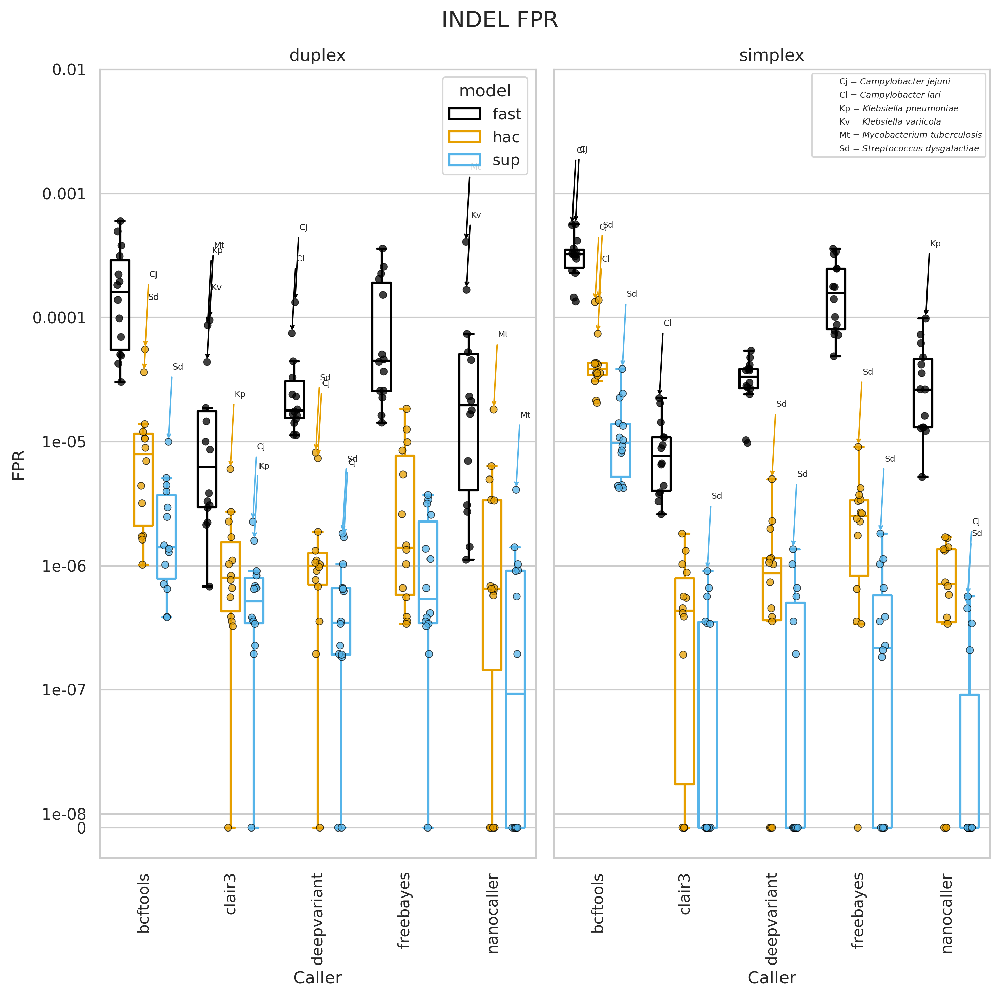

In [ ]:
no_indels = ["longshot"]
data = df.query(f"caller not in {no_indels}")
indel_fig, indel_axes = plot_fpr(data, "INDEL_FPR", "INDEL FPR")

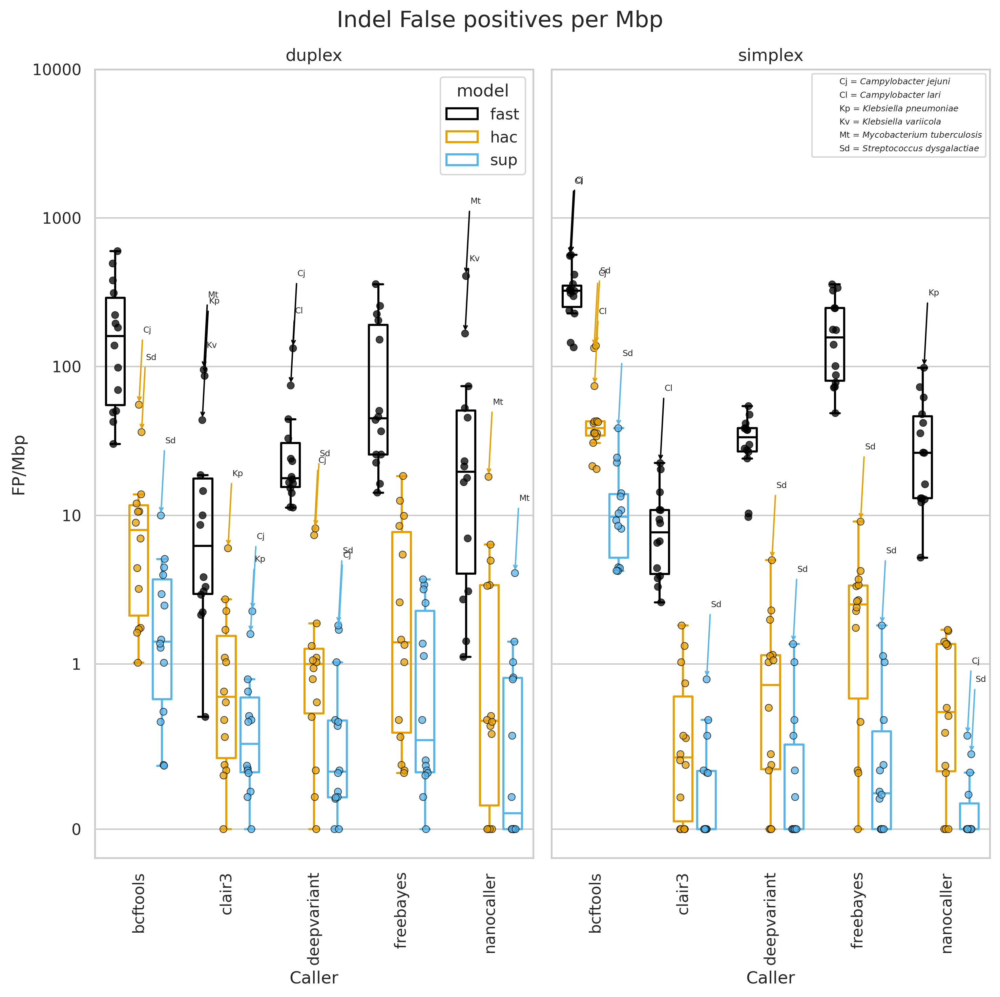

In [ ]:
indel_fig, indel_axes = plot_fpr(data, "INDEL_FP/Mbp", "Indel False positives per Mbp")

In [ ]:
import json
import numpy as np
from itertools import product

In [ ]:
illumina_fpr = pd.read_csv("../results/assess/self/self_calls_illumina.csv")
illumina_fpr

,SNP,INS,DEL,INDEL,FP,SNP_TN,INDEL_TN,TN,SNP_FPR,INDEL_FPR,...,3bp_hom_del,4bp_hom_del,5+bp_hom_del,hom_del,2bp_hom_ins,3bp_hom_ins,4bp_hom_ins,5+bp_hom_ins,hom_ins,hom_indels
0,0,0,0,0,0,4801704,4801704,4801704,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,5147091,5147091,5147091,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,5209985,5209985,5209985,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1768448,1768448,1768448,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1513368,1513368,1513368,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,2919549,2919549,2919549,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,2814137,2814137,2814137,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,2944530,2944530,2944530,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,3079933,3079933,3079933,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,5445132,5445132,5445132,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
with open("../results/assess/self/self_calls.json", "r") as f:
    full_data = json.load(f)

In [ ]:
fulldf = pd.DataFrame(full_data)

In [ ]:
alphabet = "ACGT"
trans_table = np.zeros((4,4), dtype=int)
for row in full_data:
    subst_types = row["substition_types"]
    for trans, count in subst_types.items():
        ref = trans[0]
        alt = trans[-1]
        i = alphabet.index(ref)
        j = alphabet.index(alt)
        # add count to table
        trans_table[i,j] += count

trans_table

array([[    0, 34162,  9358,  1100],
       [ 1012,     0,  3684, 19408],
       [14913, 15545,     0,  1573],
       [  491, 39841,  2726,     0]])

[Text(273.75, 0.5, 'Reference'), Text(0.5, 453.7499999999997, 'Alternate')]

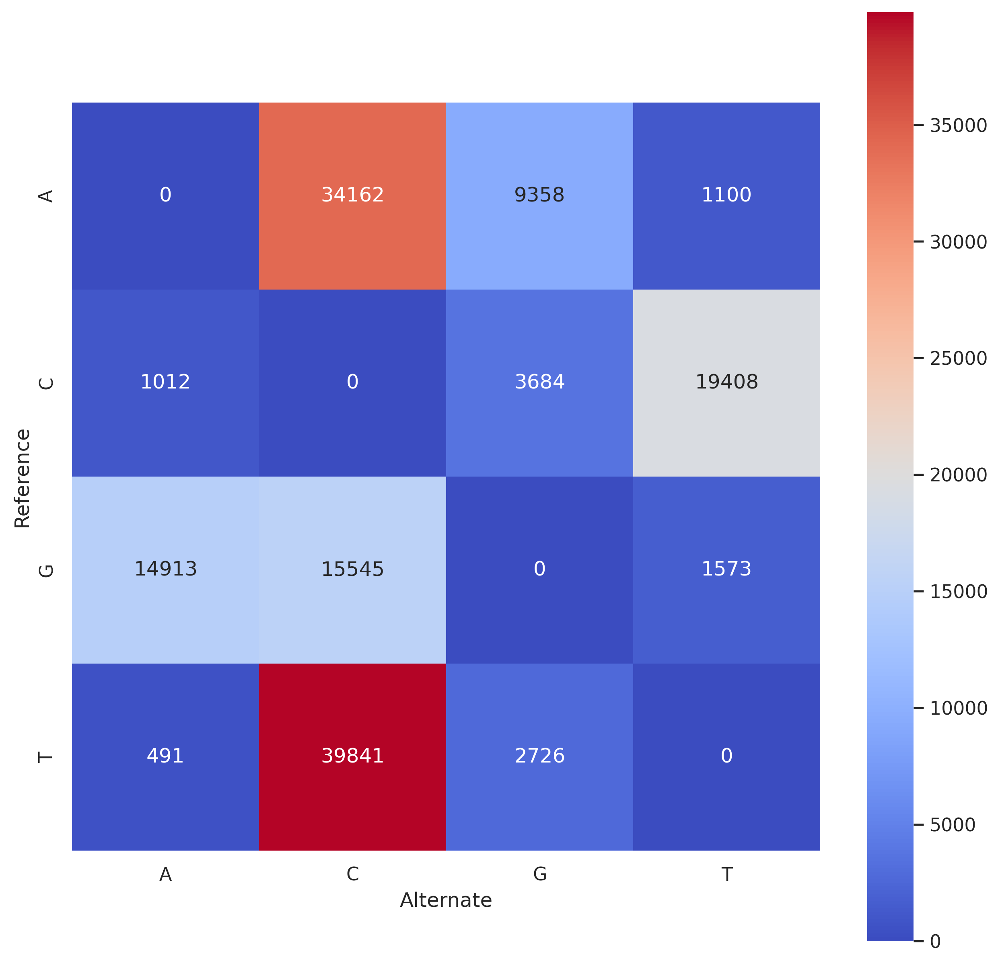

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
sns.heatmap(
    data=trans_table,
    annot=True,
    fmt="d",
    square=True,
    xticklabels=alphabet,
    yticklabels=alphabet,
    ax=ax,
    cmap="coolwarm",
)
ax.set(ylabel="Reference", xlabel="Alternate")

In [ ]:
# list of all base substitutions - e.g. A>T
substitions = []
for ref, alt in product(alphabet, repeat=2):
    substitions.append(f"{ref}>{alt}")
substitions = sorted(substitions)

samples = {d["sample"] for d in full_data}
n_samples = len(samples)
samples = sorted(list(samples))

model_substitutions = dict()
for d in full_data:
    mode = d["mode"]
    model = d["model"]
    sample = d["sample"]
    j = samples.index(sample)
    substition_types = d["substition_types"]
    if mode not in model_substitutions:
        model_substitutions[mode] = dict()
    if model not in model_substitutions[mode]:
        model_substitutions[mode][model] = np.zeros((len(substitions), n_samples), dtype=int)
    for subst, count in substition_types.items():
        i = substitions.index(subst)
        model_substitutions[mode][model][i,j] += count


In [ ]:
model_substitutions

{'duplex': {'dna_r10.4.1_e8.2_400bps_fast@v4.3.0': array([[   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
             0,    0,    0],
         [3652, 5620,    1,    4,    0,    0,    0,    0,    0,    0,   19,
           621,    0,    1],
         [1130, 1576,    3,    2,    0,   15,    7,   10,    0,    1,   13,
           704,    0,    0],
         [ 265,  424,    0,    0,    0,    0,    5,    2,    0,    0,    1,
           106,    0,    0],
         [ 136,  274,    0,    2,    0,    1,    2,    1,    0,    0,    1,
           132,    0,    0],
         [   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
             0,    0,    0],
         [ 609, 1112,    1,    1,    0,    3,   12,    3,    4,    2,    4,
           397,    0,    0],
         [2359, 2807,  100,   97,    0,  134,  324,  127,    5,    0,   17,
           705,   34,    3],
         [1311, 1508,  101,  107,    0,  133,  323,  121,    0,    0,   18,
           723,   28,    1],
      

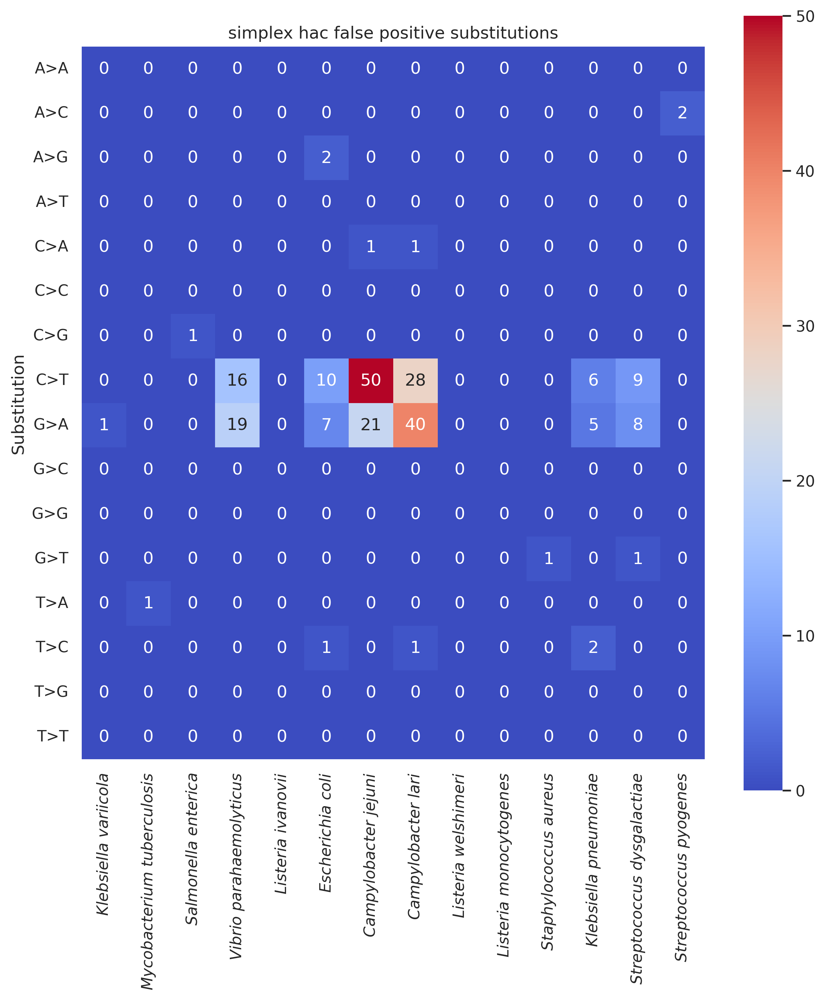

In [ ]:
mode = "simplex"
model = "hac"
data = model_substitutions[mode][f"dna_r10.4.1_e8.2_400bps_{model}@v4.3.0"]
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
xticklabels = [
    samplesheet["species"].loc[sample] for sample in samples
]
# make the xticklabels italic
xticklabels = [f"$\it{{{s.split('_')[0]}}}$ $\it{{{s.split('_')[1]}}}$" for s in xticklabels]
sns.heatmap(
    data=data,
    annot=True,
    fmt="d",
    square=True,
    xticklabels=xticklabels,
    yticklabels=substitions,
    ax=ax,
    cmap="coolwarm",
)
ax.set(ylabel="Substitution", title=f"{mode} {model} false positive substitutions")
# rotate yticklabels
for tick in ax.get_yticklabels():
    tick.set_rotation(0)

In [ ]:
fulldf.head()

,2bp_hom_del,2bp_hom_ins,3bp_hom_del,3bp_hom_ins,4bp_hom_del,4bp_hom_ins,5+bp_hom_del,5+bp_hom_ins,DEL,FP,...,hom_del,hom_indels,hom_ins,homopolymer_deletions,homopolymer_insertions,mode,model,sample,substition_types,version
0,0.090106,0.002381,0.035336,0.000794,0.012367,0.0,0.003534,0.0,566,1850,...,0.950530,0.983571,0.998413,"{'1': 458, '2': 51, '3': 20, '4': 7, '5': 1, '...","{'1': 1254, '2': 3, '3': 1}",duplex,dna_r10.4.1_e8.2_400bps_fast@v4.3.0,ATCC_10708__202309,"{'C>T': 14, 'G>A': 10}",v4.3.0
1,0.125786,0.000000,0.044025,0.000000,0.012579,0.0,0.006289,0.0,159,234,...,0.943396,0.945205,0.950000,"{'1': 120, '2': 20, '3': 7, '4': 2, '5': 1}",{'1': 57},duplex,dna_r10.4.1_e8.2_400bps_fast@v4.3.0,ATCC_17802__202309,"{'C>T': 9, 'G>A': 6}",v4.3.0
2,0.069409,0.072581,0.033419,0.000000,0.002571,0.0,0.000000,0.0,389,553,...,0.979434,0.968811,0.935484,"{'1': 340, '2': 27, '3': 13, '4': 1}","{'1': 107, '2': 9}",duplex,dna_r10.4.1_e8.2_400bps_fast@v4.3.0,ATCC_25922__202309,"{'A>G': 2, 'C>T': 16, 'G>A': 21, 'G>C': 1}",v4.3.0
3,0.044527,0.011538,0.007421,0.000000,0.003711,0.0,0.000000,0.0,539,1183,...,0.931354,0.958451,0.986538,"{'1': 472, '2': 24, '3': 4, '4': 2}","{'1': 507, '2': 6}",duplex,dna_r10.4.1_e8.2_400bps_fast@v4.3.0,ATCC_33560__202309,"{'C>G': 2, 'C>T': 66, 'G>A': 54, 'G>C': 2}",v4.3.0
4,0.053012,0.006006,0.016867,0.000000,0.007229,0.0,0.000000,0.0,415,803,...,0.934940,0.953209,0.975976,"{'1': 356, '2': 22, '3': 7, '4': 3}","{'1': 323, '2': 2}",duplex,dna_r10.4.1_e8.2_400bps_fast@v4.3.0,ATCC_35221__202309,"{'A>G': 1, 'C>T': 27, 'G>A': 24, 'G>C': 1, 'T>...",v4.3.0


In [ ]:
indel_df = fulldf.melt(
    id_vars=["sample", "mode", "model", "depth", "caller", "version"],
    value_vars=[
        "2bp_hom_del",
        "2bp_hom_ins",
        "3bp_hom_del",
        "3bp_hom_ins",
        "4bp_hom_del",
        "4bp_hom_ins",
        "5+bp_hom_del",
        "5+bp_hom_ins",
    ],
    var_name="indel_type",
    value_name="proportion",
)
indel_df.query("caller not in @no_indels and mode == 'simplex'", inplace=True)

/tmp/ipykernel_279730/2702543396.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del_df["proportion"] = -del_df["proportion"]
/tmp/ipykernel_279730/2702543396.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del_df["indel_type"] = del_df["indel_type"].str.replace("_hom_del", "")
/tmp/ipykernel_279730/2702543396.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentati

/tmp/ipykernel_279730/2702543396.py:44: UserWarning: The palette list has more values (8) than needed (5), which may not be intended.
  sns.stripplot(
/tmp/ipykernel_279730/2702543396.py:56: UserWarning: The palette list has more values (8) than needed (5), which may not be intended.
  sns.pointplot(
/tmp/ipykernel_279730/2702543396.py:61: UserWarning: The palette list has more values (8) than needed (5), which may not be intended.
  sns.pointplot(
/tmp/ipykernel_279730/2702543396.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del_df["proportion"] = -del_df["proportion"]
/tmp/ipykernel_279730/2702543396.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] 

Text(0.5, 0.98, 'Proportion of indels which are homopolymers')

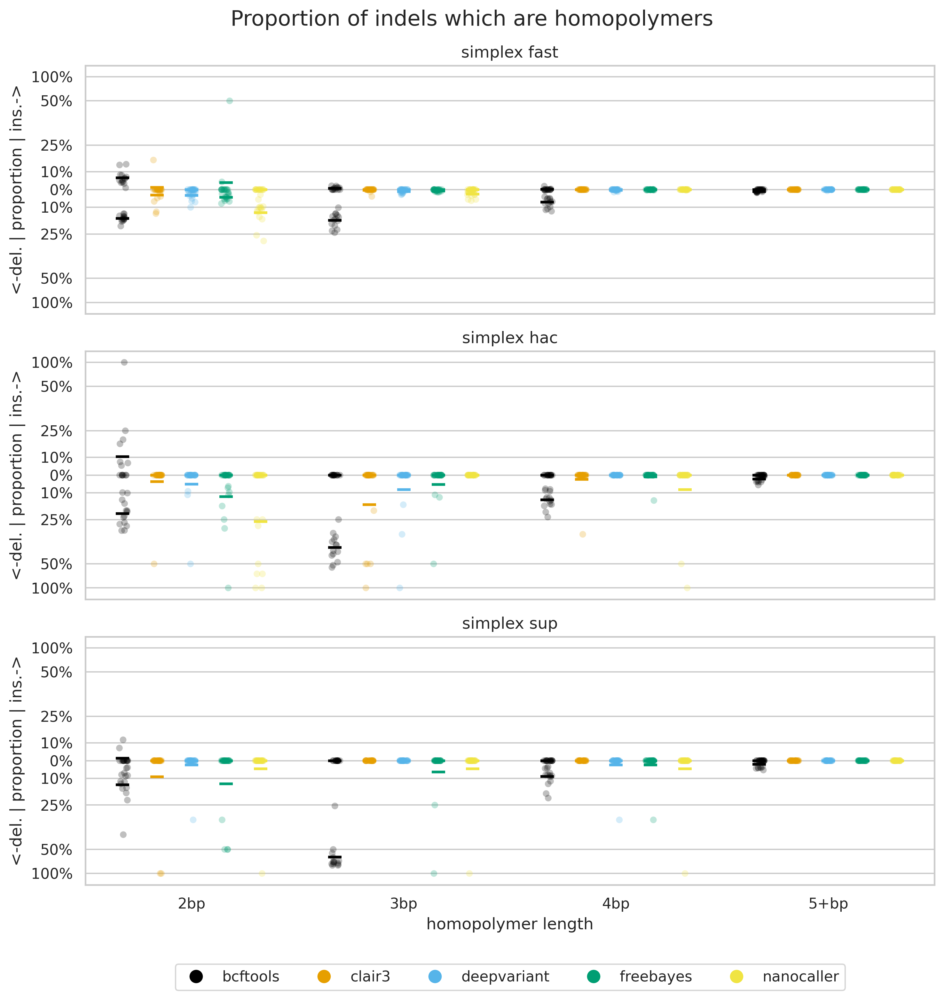

In [ ]:
row = "model"
col = "mode"
hue = "caller"
palette = cud(start=0)
fig, axes = plt.subplots(
    figsize=(10, 10),
    dpi=300,
    nrows=len(indel_df[row].unique()),
    ncols=len(indel_df[col].unique()),
    sharey=True,
    sharex=True,
    tight_layout=True,
    squeeze=False,
)
legend_drawn = False
indel_df["model"] = indel_df["model"].apply(lambda x: x.split("_")[-1].split("@")[0])

for i, model in enumerate(indel_df[row].unique()):
    model_df = indel_df.query(f"{row} == '{model}'")
    for j, mode in enumerate(model_df[col].unique()):
        mode_df = model_df.query(f"{col} == '{mode}'")
        del_df = mode_df.query("indel_type.str.contains('del')")
        # make the del_df proportions negative
        del_df["proportion"] = -del_df["proportion"]
        # remove the "del" from the indel_type
        del_df["indel_type"] = del_df["indel_type"].str.replace("_hom_del", "")
        ins_df = mode_df.query("indel_type.str.contains('ins')")
        # remove the "ins" from the indel_type
        ins_df["indel_type"] = ins_df["indel_type"].str.replace("_hom_ins", "")
        ax = axes[i, j]
        kwargs = dict(
            x="indel_type",
            y="proportion",
            hue=hue,
            palette=palette,
            ax=ax,
            dodge=0.4,
            alpha=0.25
        )
        sns.stripplot(
            data=del_df,
            **kwargs,
        )
        sns.stripplot(
            data=ins_df,
            legend=False,
            **kwargs,
        )

        del kwargs["alpha"]
        kwargs["dodge"] = 0.65
        kwargs["markersize"] = 10
        kwargs["marker"] = "_"
        kwargs["linestyle"] = "none"
        kwargs["errorbar"] = None
        sns.pointplot(
            data=del_df,
            legend=False,
            **kwargs,
        )
        sns.pointplot(
            data=ins_df,
            legend=False,
            **kwargs,
        )


        ax.set_title(f"{mode} {model}")
        ax.set_xlabel("homopolymer length")
        ax.set_ylabel("<-del. | proportion | ins.->")
        ax.set_yscale("symlog", linthresh=0.5)
        yticks = [-1.0, -0.5, -0.25, -0.1, 0, 0.1, 0.25, 0.5, 1]
        ax.set_yticks(yticks)
        ax.set_yticklabels([f"{abs(y):.0%}" for y in yticks])

        if not legend_drawn:
            lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
            lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
            for line in lines:
                line.set_alpha(1)
            fig.legend(
                lines,
                labels,
                loc="lower center",
                # title=hue,
                ncols=len(fulldf[hue].unique()),
                bbox_to_anchor=(0.54, -0.05),
                markerscale=2,
            )
            legend_drawn = True
        
        ax.get_legend().remove()

fig.suptitle("Proportion of indels which are homopolymers", fontsize=16)

# Precision Recall curves

In [20]:
from pathlib import Path
import numpy as np

In [21]:
frames = []
for p in Path("../results/assess/mutref").rglob("*.precision-recall.tsv"):
    df = pd.read_csv(p, sep="\t")
    df["sample"] = p.parent.name
    if "without_repetitive_regions" in p.name:
        df["mask_repeats"] = True
    else:
        df["mask_repeats"] = False
    if "illumina" in str(p):
        df["caller"] = "illumina"
        df["depth"] = "illumina"
        df["mode"] = "simplex"
        df["version"] = "illumina"
        df["model"] = "illumina"
    else:
        df["caller"] = p.parts[-7]
        df["depth"] = p.parts[-6]
        df["mode"] = p.parts[-5]
        df["version"] = p.parts[-4]
        df["model"] = p.parts[-3].split("_")[-1].split("@")[0]
    frames.append(df)
    # duplicate Illumina as duplex also
    if "illumina" in str(p):
        df2 = df.copy()
        df2["caller"] = "illumina"
        df2["depth"] = "illumina"
        df2["mode"] = "duplex"
        df2["version"] = "illumina"
        df2["model"] = "illumina"
        frames.append(df2)

In [22]:
pr_df = pd.concat(frames)
pr_df.reset_index(inplace=True)
pr_df.head()

,index,VAR_TYPE,MIN_QUAL,PREC,RECALL,F1_SCORE,F1_QSCORE,TRUTH_TOTAL,TRUTH_TP,TRUTH_FN,QUERY_TOTAL,QUERY_TP,QUERY_FP,sample,mask_repeats,caller,depth,mode,version,model
0,0,SNP,0,0.856053,0.854424,0.855238,8.393458,2102,1796,306,2098,1796,302,AMtb_1__202402,False,nanocaller,100x,duplex,v4.3.0,hac
1,1,SNP,1,0.856053,0.854424,0.855238,8.393458,2102,1796,306,2098,1796,302,AMtb_1__202402,False,nanocaller,100x,duplex,v4.3.0,hac
2,2,SNP,2,0.856053,0.854424,0.855238,8.393458,2102,1796,306,2098,1796,302,AMtb_1__202402,False,nanocaller,100x,duplex,v4.3.0,hac
3,3,SNP,3,0.856053,0.854424,0.855238,8.393458,2102,1796,306,2098,1796,302,AMtb_1__202402,False,nanocaller,100x,duplex,v4.3.0,hac
4,4,SNP,4,0.856053,0.854424,0.855238,8.393458,2102,1796,306,2098,1796,302,AMtb_1__202402,False,nanocaller,100x,duplex,v4.3.0,hac


In [23]:
def plot_best(data, x, y, hue, xlabel, ylabel, yscale, yticks, title, yticklabels):
    order = sorted(set(data[x]))
    order.insert(0, order.pop(order.index("illumina")))
    palette = cud(n=len(set(data[hue])))
    fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
    sns.boxplot(
        data=data,
        x=x,
        y=y,
        order=order,
        hue=hue,
        ax=ax,
        palette=palette,
        fill=False,
        fliersize=0,
    )
    sns.stripplot(
        data=data,
        x=x,
        y=y,
        order=order,
        hue=hue,
        ax=ax,
        palette=palette,
        alpha=0.5,
        dodge=True,
        legend=False,
        linewidth=0.5,
        edgecolor="black",
    )
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)
    if yscale == "logit":
        ax.set_yscale(yscale, nonpositive="clip")
    elif yscale == "symlog":
        # we want to see values close to or equal to 1
        ax.set_yscale(yscale, linthresh=1.0)
    else:
        ax.set_yscale(yscale)

    if yticks:
        ax.set_yticks(yticks)
    
    if yticklabels:
        ax.set_yticklabels(yticklabels)
    ax.set_title(title)
    return fig, ax

# Simplex SNP F1 score

/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/717107311.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)


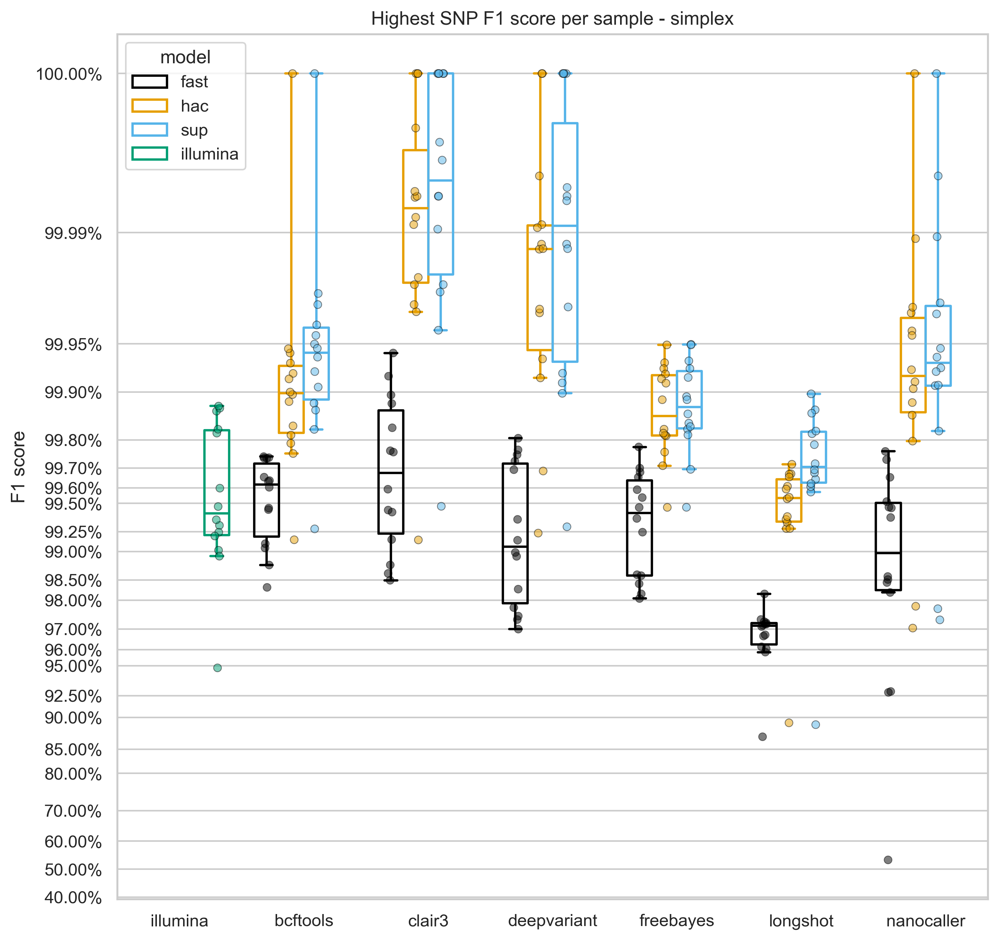

In [30]:
vartype = "SNP"
mode = "simplex"
y = "F1_SCORE"
x = "caller"
hue = "model"
dataix = (
    pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats")
    .groupby([x, hue, "sample"])[y]
    .idxmax()
)
data = pr_df.iloc[dataix]
# transform precision so logit shows values of 1.0 - i.e. change values of 1.0 to 0.99999
cap = 0.99999
data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
ylabel = "F1 score"
xlabel = ""
yscale = "logit"
yticks = [
    0.4,
    0.5,
    0.6,
    0.7,
    0.8,
    0.85,
    0.9,
    0.925,
    0.95,
    0.96,
    0.97,
    0.98,
    0.985,
    0.99,
    0.9925,
    0.995,
    0.996,
    0.997,
    0.998,
    0.999,
    0.9995,
    0.9999,
    cap
]
yticklabels = [f"{yval:.2%}" for yval in yticks]
title = f"Highest {vartype} F1 score per sample - {mode}"
fig, ax = plot_best(
    data=data,
    x=x,
    y=y,
    hue=hue,
    xlabel=xlabel,
    ylabel=ylabel,
    yscale=yscale,
    yticks=yticks,
    title=title,
    yticklabels=yticklabels,
)

In [28]:
data.loc[data.groupby([hue, x])[y].idxmin()]

,index,VAR_TYPE,MIN_QUAL,PREC,RECALL,F1_SCORE,F1_QSCORE,TRUTH_TOTAL,TRUTH_TP,TRUTH_FN,QUERY_TOTAL,QUERY_TP,QUERY_FP,sample,mask_repeats,caller,depth,mode,version,model
398311,63,SNP,63,0.989935,0.976826,0.983337,17.782480,4531,4426,105,4471,4426,45,ATCC_25922__202309,False,bcftools,100x,simplex,v4.3.0,fast
250600,8,SNP,8,0.989909,0.980019,0.984939,18.221474,2102,2060,42,2081,2060,21,AMtb_1__202402,False,clair3,100x,simplex,v4.3.0,fast
3554443,11,SNP,11,0.975234,0.964688,0.969932,15.219001,4531,4371,160,4482,4371,111,ATCC_25922__202309,False,deepvariant,100x,simplex,v4.3.0,fast
5526217,225,SNP,225,0.985956,0.975061,0.980478,17.094807,4531,4418,113,4486,4423,63,ATCC_25922__202309,False,freebayes,100x,simplex,v4.3.0,fast
716528,380,SNP,380,0.999345,0.772992,0.871714,8.918218,7894,6102,1792,6106,6102,4,BPH2947__202310,False,longshot,100x,simplex,v4.3.0,fast
162565,29,SNP,29,0.560503,0.509039,0.533533,3.311788,2102,1070,1032,1909,1070,839,AMtb_1__202402,False,nanocaller,100x,simplex,v4.3.0,fast
345384,0,SNP,0,0.997543,0.985654,0.991563,20.738131,4531,4466,65,4477,4466,11,ATCC_25922__202309,False,bcftools,100x,simplex,v4.3.0,hac
227509,5,SNP,5,0.999776,0.983447,0.991544,20.728447,4531,4456,75,4455,4454,1,ATCC_25922__202309,False,clair3,100x,simplex,v4.3.0,hac
3532480,0,SNP,0,0.999328,0.985434,0.992332,21.153372,4531,4465,66,4466,4463,3,ATCC_25922__202309,False,deepvariant,100x,simplex,v4.3.0,hac
4394059,171,SNP,171,0.995146,0.994262,0.994703,22.760086,4531,4505,26,4532,4510,22,ATCC_25922__202309,False,freebayes,100x,simplex,v4.3.0,hac


# Simplex SNP Recall

/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/1210268995.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)


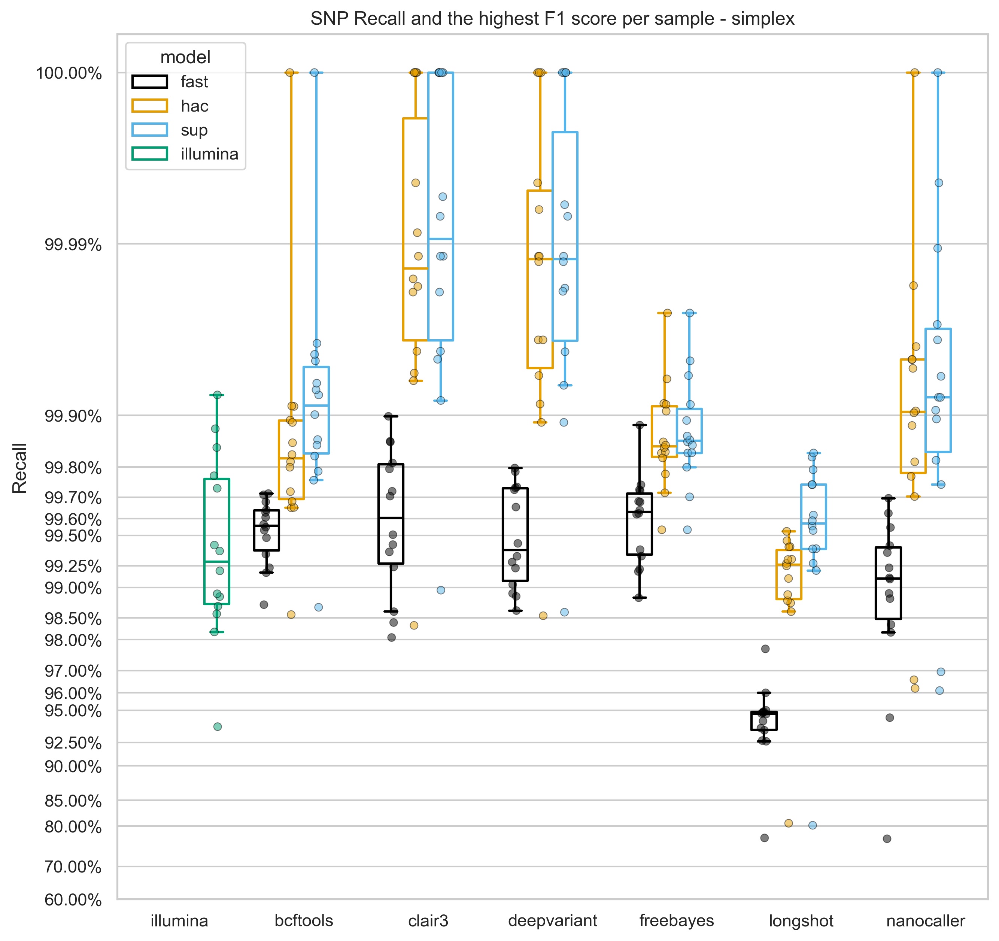

In [34]:
vartype = "SNP"
mode = "simplex"
y = "RECALL"
x = "caller"
hue = "model"
dataix = (
    pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats")
    .groupby([x, hue, "sample"])[y]
    .idxmax()
)
data = pr_df.iloc[dataix]
# transform precision so logit shows values of 1.0 - i.e. change values of 1.0 to 0.99999
cap = 0.99999
data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
ylabel = "Recall"
xlabel = ""
yscale = "logit"
yticks = [
    0.6,
    0.7,
    0.8,
    0.85,
    0.9,
    0.925,
    0.95,
    0.96,
    0.97,
    0.98,
    0.985,
    0.99,
    0.9925,
    0.995,
    0.996,
    0.997,
    0.998,
    0.999,
    0.9999,
    cap
]
yticklabels = [f"{yval:.2%}" for yval in yticks]
title = f"{vartype} {ylabel} and the highest F1 score per sample - {mode}"
fig, ax = plot_best(
    data=data,
    x=x,
    y=y,
    hue=hue,
    xlabel=xlabel,
    ylabel=ylabel,
    yscale=yscale,
    yticks=yticks,
    title=title,
    yticklabels=yticklabels,
)

In [16]:
data.loc[data.groupby([hue, x])[y].idxmin()]

,index,VAR_TYPE,MIN_QUAL,PREC,RECALL,F1_SCORE,F1_QSCORE,TRUTH_TOTAL,TRUTH_TP,TRUTH_FN,QUERY_TOTAL,QUERY_TP,QUERY_FP,sample,mask_repeats,caller,depth,mode,version,model
423256,0,SNP,0,0.870276,0.879527,0.874877,9.026619,4059,3570,489,4101,3569,532,ATCC_17802__202309,False,bcftools,100x,simplex,v4.3.0,fast
265864,0,SNP,0,0.943509,0.873121,0.906952,10.312914,4059,3544,515,3682,3474,208,ATCC_17802__202309,False,clair3,100x,simplex,v4.3.0,fast
3453552,0,SNP,0,0.828435,0.733432,0.778044,6.537337,4059,2977,1082,3573,2960,613,ATCC_17802__202309,False,deepvariant,100x,simplex,v4.3.0,fast
5802680,0,SNP,0,0.717138,0.887411,0.793240,6.845326,4059,3602,457,5059,3628,1431,ATCC_17802__202309,False,freebayes,100x,simplex,v4.3.0,fast
720100,0,SNP,0,0.986328,0.747016,0.850152,8.243500,11396,8513,2883,8631,8513,118,BPH2947__202310,False,longshot,100x,simplex,v4.3.0,fast
165384,0,SNP,0,0.300901,0.757156,0.430656,2.446250,2166,1640,526,5437,1636,3801,AMtb_1__202402,False,nanocaller,100x,simplex,v4.3.0,fast
370392,0,SNP,0,0.942645,0.875585,0.907878,10.356380,4059,3554,505,3766,3550,216,ATCC_17802__202309,False,bcftools,100x,simplex,v4.3.0,hac
241000,0,SNP,0,0.978830,0.889135,0.931829,11.664017,4059,3609,450,3590,3514,76,ATCC_17802__202309,False,clair3,100x,simplex,v4.3.0,hac
3433680,0,SNP,0,0.975652,0.842326,0.904100,10.181811,4059,3419,640,3450,3366,84,ATCC_17802__202309,False,deepvariant,100x,simplex,v4.3.0,hac
4720224,0,SNP,0,0.925700,0.894063,0.909606,10.438612,4059,3629,430,3930,3638,292,ATCC_17802__202309,False,freebayes,100x,simplex,v4.3.0,hac


# Simplex SNP Precision

/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/1478913679.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)


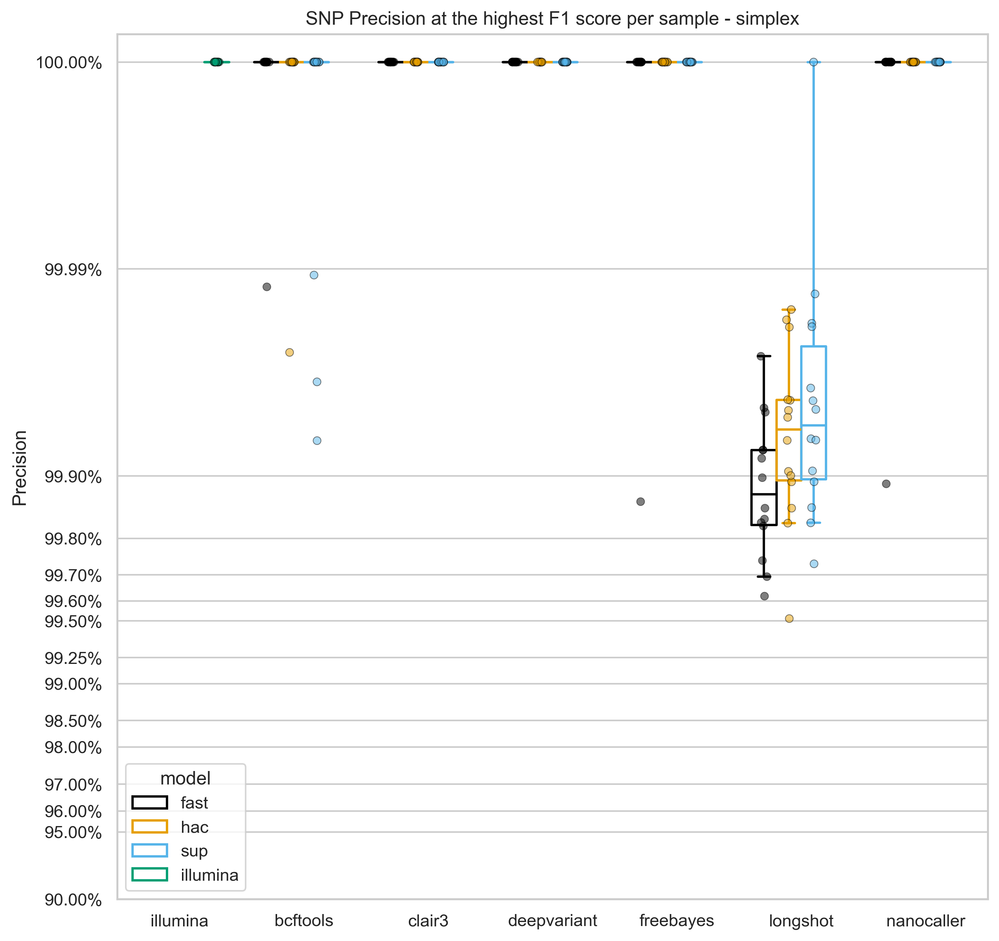

In [56]:
vartype = "SNP"
mode = "simplex"
y = "PREC"
x = "caller"
hue = "model"
dataix = (
    pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats")
    .groupby([x, hue, "sample"])[y]
    .idxmax()
)
data = pr_df.iloc[dataix]
# transform precision so logit shows values of 1.0 - i.e. change values of 1.0 to 0.99999
cap = 0.99999
data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
ylabel = "Precision"
xlabel = ""
yscale = "logit"
yticks = [
    0.9,
    0.95,
    0.96,
    0.97,
    0.98,
    0.985,
    0.99,
    0.9925,
    0.995,
    0.996,
    0.997,
    0.998,
    0.999,
    0.9999,
    cap
]
yticklabels = [f"{yval:.2%}" for yval in yticks]
title = f"{vartype} {ylabel} at the highest F1 score per sample - {mode}"
fig, ax = plot_best(
    data=data,
    x=x,
    y=y,
    hue=hue,
    xlabel=xlabel,
    ylabel=ylabel,
    yscale=yscale,
    yticks=yticks,
    title=title,
    yticklabels=yticklabels,
)

In [30]:
data.loc[data.groupby([hue, x])[y].idxmin()]

,index,VAR_TYPE,MIN_QUAL,PREC,RECALL,F1_SCORE,F1_QSCORE,TRUTH_TOTAL,TRUTH_TP,TRUTH_FN,QUERY_TOTAL,QUERY_TP,QUERY_FP,sample,mask_repeats,caller,depth,mode,version,model
411204,220,SNP,220,0.997881,0.867848,0.928333,11.446832,11396,9890,1506,9911,9890,21,BPH2947__202310,False,bcftools,100x,simplex,v4.3.0,fast
260125,33,SNP,33,0.999778,0.394788,0.566054,3.625647,11396,4499,6897,4500,4499,1,BPH2947__202310,False,clair3,100x,simplex,v4.3.0,fast
3452970,34,SNP,34,1.000000,0.589833,0.742006,5.883905,25592,15095,10497,15095,15095,0,AJ292__202310,False,deepvariant,100x,simplex,v4.3.0,fast
5414777,1225,SNP,1225,0.998844,0.477618,0.646229,4.512773,7238,3457,3781,3461,3457,4,ATCC_25922__202309,False,freebayes,100x,simplex,v4.3.0,fast
746652,500,SNP,500,0.951946,0.795516,0.866729,8.752654,4059,3229,830,3392,3229,163,ATCC_17802__202309,False,longshot,100x,simplex,v4.3.0,fast
183777,73,SNP,73,0.996879,0.731210,0.843623,8.058276,15261,11159,4102,11213,11178,35,ATCC_BAA-679__202309,False,nanocaller,100x,simplex,v4.3.0,fast
370627,235,SNP,235,0.994186,0.042129,0.080832,0.366051,4059,171,3888,172,171,1,ATCC_17802__202309,False,bcftools,100x,simplex,v4.3.0,hac
235262,34,SNP,34,0.999714,0.613022,0.760009,6.198044,11396,6986,4410,6988,6986,2,BPH2947__202310,False,clair3,100x,simplex,v4.3.0,hac
3432902,22,SNP,22,1.000000,0.978978,0.989377,19.737635,25592,25054,538,25047,25047,0,AJ292__202310,False,deepvariant,100x,simplex,v4.3.0,hac
4687847,3167,SNP,3167,1.000000,0.065997,0.123822,0.574079,25592,1689,23903,1689,1689,0,AJ292__202310,False,freebayes,100x,simplex,v4.3.0,hac


# Simplex INDEL F1 score

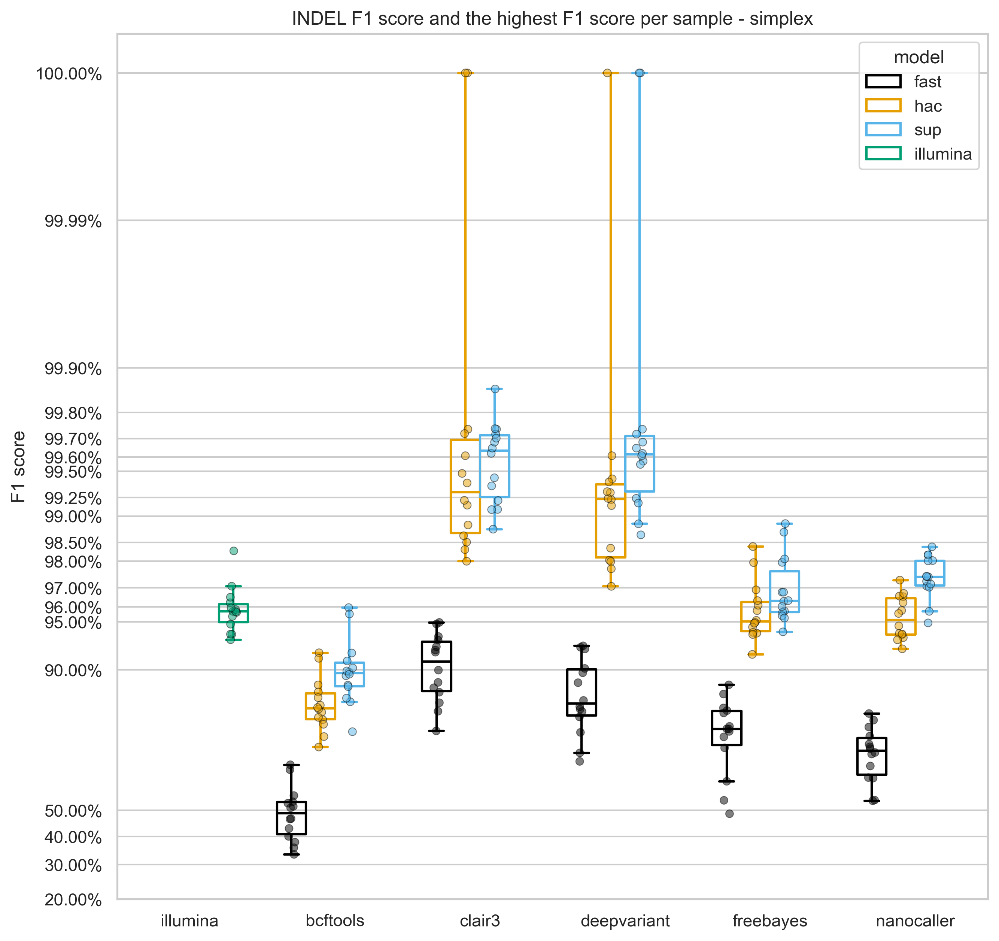

In [44]:
vartype = "INDEL"
mode = "simplex"
y = "F1_SCORE"
x = "caller"
hue = "model"
dataix = (
    pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats")
    .groupby([x, hue, "sample"])[y]
    .idxmax()
)
data = pr_df.iloc[dataix]
# remove longshot
data = data.query(f"{x} != 'longshot'")
# transform precision so logit shows values of 1.0 - i.e. change values of 1.0 to 0.99999
cap = 0.99999
data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
ylabel = "F1 score"
xlabel = ""
yscale = "logit"
yticks = [
    0.2,
    0.3,
    0.4,
    0.5,
    0.9,
    0.95,
    0.96,
    0.97,
    0.98,
    0.985,
    0.99,
    0.9925,
    0.995,
    0.996,
    0.997,
    0.998,
    0.999,
    0.9999,
    cap,
]
yticklabels = [f"{yval:.2%}" for yval in yticks]
title = f"{vartype} {ylabel} and the highest F1 score per sample - {mode}"
fig, ax = plot_best(
    data=data,
    x=x,
    y=y,
    hue=hue,
    xlabel=xlabel,
    ylabel=ylabel,
    yscale=yscale,
    yticks=yticks,
    title=title,
    yticklabels=yticklabels,
)

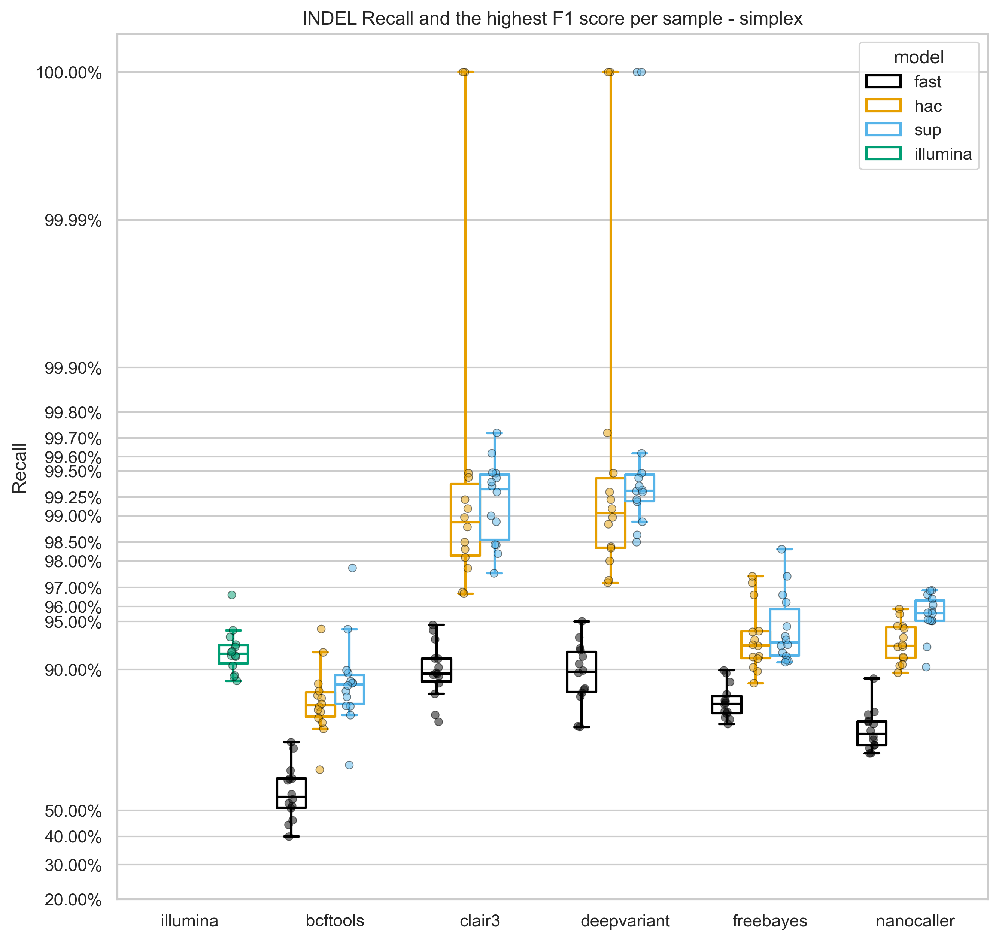

In [45]:
vartype = "INDEL"
mode = "simplex"
y = "RECALL"
x = "caller"
hue = "model"
dataix = (
    pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats")
    .groupby([x, hue, "sample"])[y]
    .idxmax()
)
data = pr_df.iloc[dataix]
# remove longshot
data = data.query(f"{x} != 'longshot'")
# transform precision so logit shows values of 1.0 - i.e. change values of 1.0 to 0.99999
cap = 0.99999
data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
ylabel = "Recall"
xlabel = ""
yscale = "logit"
yticks = [
    0.2,
    0.3,
    0.4,
    0.5,
    0.9,
    0.95,
    0.96,
    0.97,
    0.98,
    0.985,
    0.99,
    0.9925,
    0.995,
    0.996,
    0.997,
    0.998,
    0.999,
    0.9999,
    cap,
]
yticklabels = [f"{yval:.2%}" for yval in yticks]
title = f"{vartype} {ylabel} and the highest F1 score per sample - {mode}"
fig, ax = plot_best(
    data=data,
    x=x,
    y=y,
    hue=hue,
    xlabel=xlabel,
    ylabel=ylabel,
    yscale=yscale,
    yticks=yticks,
    title=title,
    yticklabels=yticklabels,
)

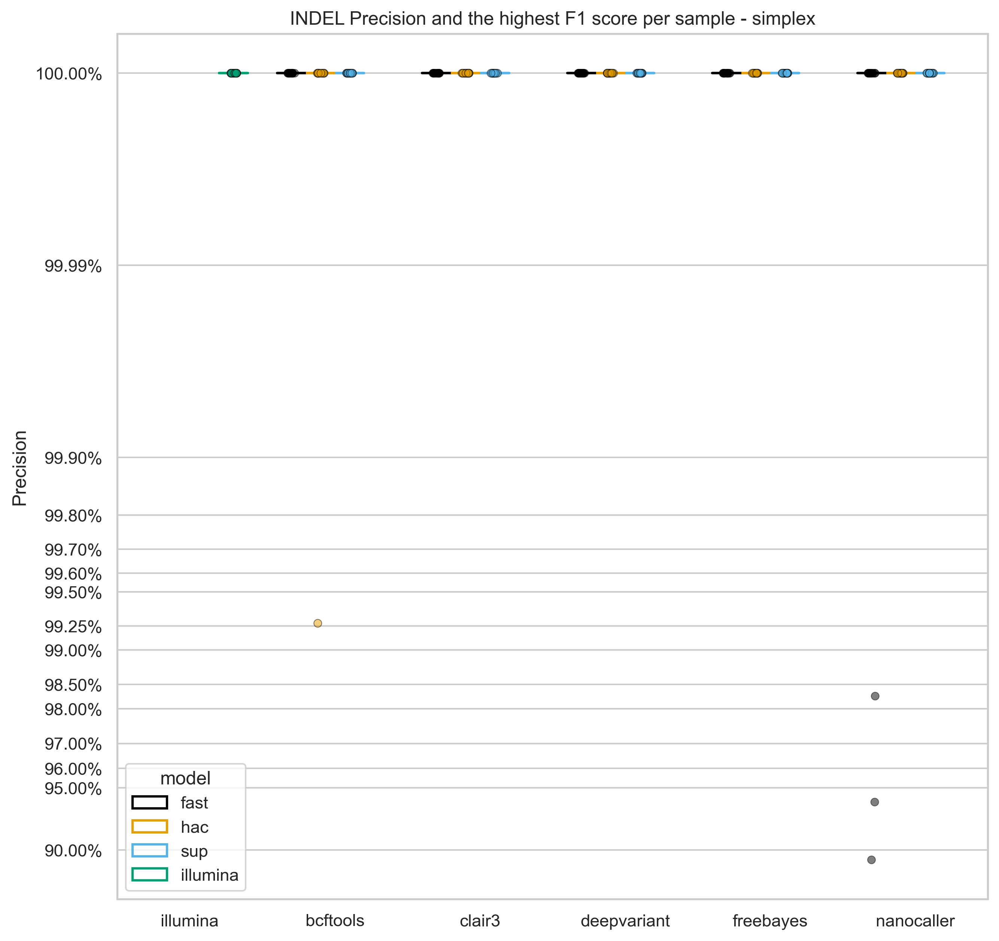

In [47]:
vartype = "INDEL"
mode = "simplex"
y = "PREC"
x = "caller"
hue = "model"
dataix = (
    pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats")
    .groupby([x, hue, "sample"])[y]
    .idxmax()
)
data = pr_df.iloc[dataix]
# remove longshot
data = data.query(f"{x} != 'longshot'")
# transform precision so logit shows values of 1.0 - i.e. change values of 1.0 to 0.99999
cap = 0.99999
data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
ylabel = "Precision"
xlabel = ""
yscale = "logit"
yticks = [
    0.9,
    0.95,
    0.96,
    0.97,
    0.98,
    0.985,
    0.99,
    0.9925,
    0.995,
    0.996,
    0.997,
    0.998,
    0.999,
    0.9999,
    cap,
]
yticklabels = [f"{yval:.2%}" for yval in yticks]
title = f"{vartype} {ylabel} and the highest F1 score per sample - {mode}"
fig, ax = plot_best(
    data=data,
    x=x,
    y=y,
    hue=hue,
    xlabel=xlabel,
    ylabel=ylabel,
    yscale=yscale,
    yticks=yticks,
    title=title,
    yticklabels=yticklabels,
)

In [ ]:
data.loc[data.groupby(["caller", "model"])["F1_SCORE"].idxmin()]

,index,VAR_TYPE,MIN_QUAL,PREC,RECALL,F1_SCORE,F1_QSCORE,TRUTH_TOTAL,TRUTH_TP,TRUTH_FN,QUERY_TOTAL,QUERY_TP,QUERY_FP,sample,mask_repeats,caller,depth,mode,version,model
423567,311,INDEL,75,0.725806,0.101580,0.178218,0.852433,443,45,398,62,45,17,ATCC_17802__202309,False,bcftools,100x,simplex,v4.3.0,fast
370685,293,INDEL,57,0.807018,0.205418,0.327479,1.722941,443,91,352,114,92,22,ATCC_17802__202309,False,bcftools,100x,simplex,v4.3.0,hac
397068,244,INDEL,8,0.841270,0.232506,0.364322,1.967628,443,103,340,126,106,20,ATCC_17802__202309,False,bcftools,100x,simplex,v4.3.0,sup
265089,113,INDEL,2,0.864407,0.700000,0.773564,6.450554,350,245,105,295,255,40,AJ292__202310,False,clair3,100x,simplex,v4.3.0,fast
241112,112,INDEL,1,0.976982,0.805869,0.883214,9.326098,443,357,86,391,382,9,ATCC_17802__202309,False,clair3,100x,simplex,v4.3.0,hac
253544,112,INDEL,1,0.978673,0.853273,0.911681,10.539467,443,378,65,422,413,9,ATCC_17802__202309,False,clair3,100x,simplex,v4.3.0,sup
3445428,76,INDEL,8,0.745020,0.369781,0.494249,2.960629,503,186,317,251,187,64,AMtb_1__202402,False,deepvariant,100x,simplex,v4.3.0,fast
3423384,104,INDEL,4,0.984314,0.497018,0.660516,4.691806,503,250,253,255,251,4,AMtb_1__202402,False,deepvariant,100x,simplex,v4.3.0,hac
3434441,105,INDEL,5,0.996139,0.510934,0.675431,4.886923,503,257,246,259,258,1,AMtb_1__202402,False,deepvariant,100x,simplex,v4.3.0,sup
5369282,1914,INDEL,170,0.668246,0.280318,0.394958,2.182144,503,141,362,211,141,70,AMtb_1__202402,False,freebayes,100x,simplex,v4.3.0,fast


# Duplex SNP F1 score

/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/1418322416.py:11: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(
/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/1418322416.py:22: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.stripplot(


Text(0.5, 1.0, 'Highest SNP F1 score per sample - duplex')

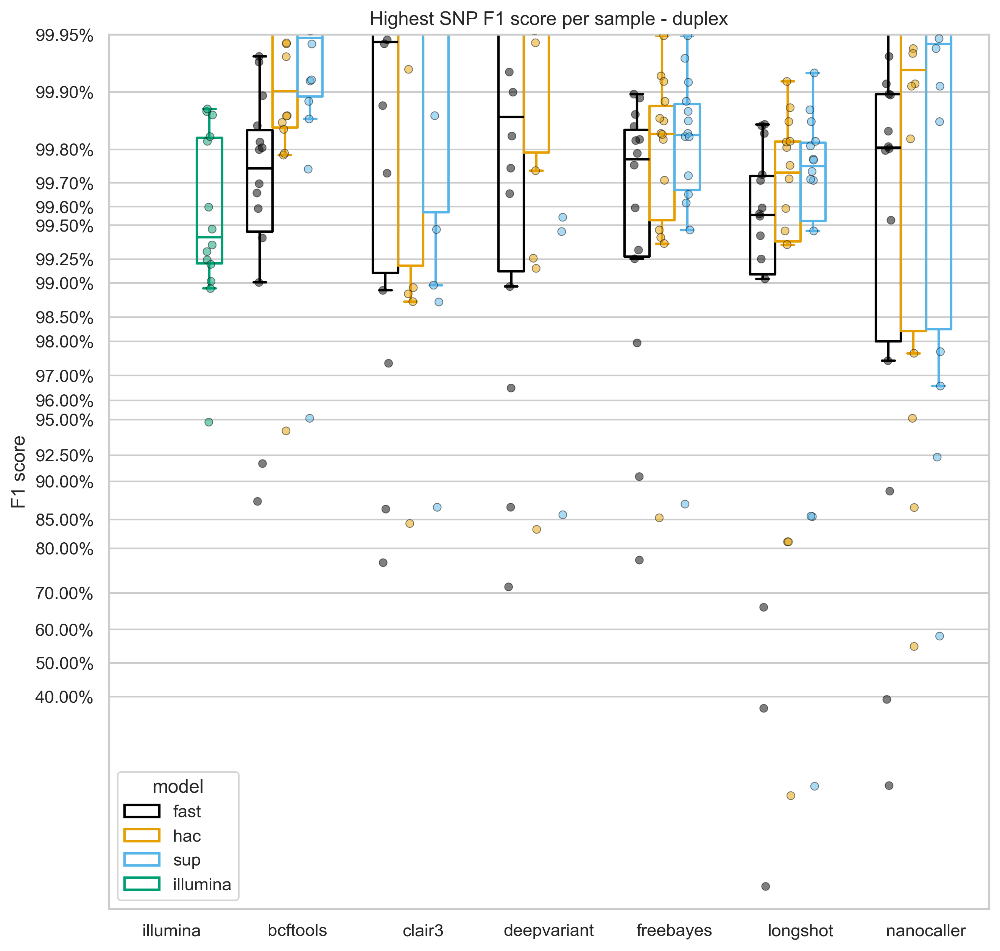

In [57]:
vartype = "SNP"
mode = "duplex"
y = "F1_SCORE"
x = "caller"
hue = "model"
dataix = pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats").groupby([x, hue, "sample"])[y].idxmax()
data = pr_df.iloc[dataix]
order = sorted(set(data[x]))
order.insert(0, order.pop(order.index("illumina")))
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
sns.boxplot(
    data=data,
    x=x,
    y=y,
    order=order,
    hue=hue,
    ax=ax,
    palette=cud(),
    fill=False,
    fliersize=0
)
sns.stripplot(
    data=data,
    x=x,
    y=y,
    order=order,
    hue=hue,
    ax=ax,
    palette=cud(),
    alpha=0.5,
    dodge=True,
    legend=False,
    linewidth=0.5,
    edgecolor="black",
)
ax.set_ylabel("F1 score")
ax.set_xlabel("")
ax.set_yscale("logit")
yticks = [0.4, 0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 0.925, 0.95, 0.96, 0.97, 0.98, 0.985, 0.99, 0.9925, 0.995, 0.996, 0.997, 0.998, 0.999, 0.9995]
ax.set_yticks(yticks)
_ = ax.set_yticklabels([f"{yval:.2%}" for yval in yticks])
ax.set_title(f"Highest {vartype} F1 score per sample - {mode}")

In [ ]:
data.loc[data.groupby([hue, x])["F1_SCORE"].idxmin()]

,index,VAR_TYPE,MIN_QUAL,PREC,RECALL,F1_SCORE,F1_QSCORE,TRUTH_TOTAL,TRUTH_TP,TRUTH_FN,QUERY_TOTAL,QUERY_TP,QUERY_FP,sample,mask_repeats,caller,depth,mode,version,model
341180,0,SNP,0,0.963173,0.815114,0.882980,9.317399,19412,15823,3589,16428,15823,605,KPC2__202310,False,bcftools,100x,duplex,v4.3.0,fast
228224,0,SNP,0,0.982929,0.647744,0.780887,6.593328,19412,12574,6838,12770,12552,218,KPC2__202310,False,clair3,100x,duplex,v4.3.0,fast
3421972,0,SNP,0,0.997922,0.494849,0.661616,4.705899,19412,9606,9806,9626,9606,20,KPC2__202310,False,deepvariant,100x,duplex,v4.3.0,fast
4204660,12,SNP,12,0.988917,0.657531,0.789875,6.775219,19412,12764,6648,12903,12760,143,KPC2__202310,False,freebayes,100x,duplex,v4.3.0,fast
574432,0,SNP,0,0.992390,0.033587,0.064976,0.291772,19412,652,18760,657,652,5,KPC2__202310,False,longshot,100x,duplex,v4.3.0,fast
66234,50,SNP,50,0.292135,0.144044,0.192950,0.930995,2166,312,1854,1068,312,756,AMtb_1__202402,False,nanocaller,100x,duplex,v4.3.0,fast
291287,31,SNP,31,0.950611,0.882237,0.915148,10.713405,4059,3581,478,3766,3580,186,ATCC_17802__202309,False,bcftools,100x,duplex,v4.3.0,hac
207244,0,SNP,0,0.998421,0.751442,0.857502,8.461923,19412,14587,4825,14568,14545,23,KPC2__202310,False,clair3,100x,duplex,v4.3.0,hac
3401832,0,SNP,0,0.999449,0.654028,0.790659,6.791447,19412,12696,6716,12699,12692,7,KPC2__202310,False,deepvariant,100x,duplex,v4.3.0,hac
3703537,5,SNP,5,0.995334,0.768803,0.867524,8.778635,19412,14924,4488,15003,14933,70,KPC2__202310,False,freebayes,100x,duplex,v4.3.0,hac


# Duplex INDEL F1 score

/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_15698/1990955792.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.query(f"{x} != 'longshot'", inplace=True)
/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_15698/1990955792.py:13: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.boxplot(
/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_15698/1990955792.py:24: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  sns.stripplot(


Text(0.5, 1.0, 'Highest INDEL F1 score per sample - duplex')

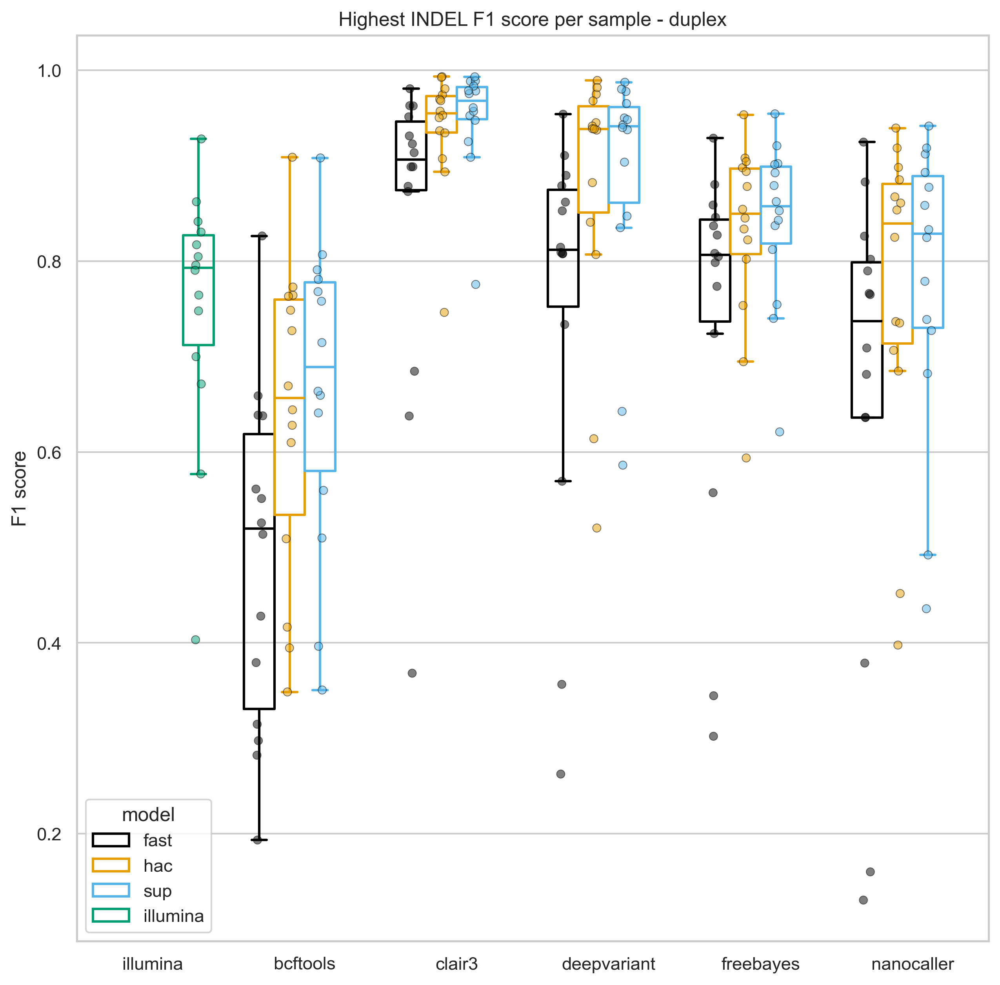

In [ ]:
vartype = "INDEL"
mode = "duplex"
y = "F1_SCORE"
x = "caller"
hue = "model"
dataix = pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats").groupby([x, hue, "sample"])[y].idxmax()
data = pr_df.iloc[dataix]
# remove longshot
data.query(f"{x} != 'longshot'", inplace=True)
order = sorted(set(data[x]))
order.insert(0, order.pop(order.index("illumina")))
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
sns.boxplot(
    data=data,
    x=x,
    y=y,
    order=order,
    hue=hue,
    ax=ax,
    palette=cud(),
    fill=False,
    fliersize=0
)
sns.stripplot(
    data=data,
    x=x,
    y=y,
    order=order,
    hue=hue,
    ax=ax,
    palette=cud(),
    alpha=0.5,
    dodge=True,
    legend=False,
    linewidth=0.5,
    edgecolor="black",
)
ax.set_ylabel("F1 score")
ax.set_xlabel("")
# ax.set_yscale("logit")
# yticks = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.985, 0.99]
# ax.set_yticks(yticks)
# _ = ax.set_yticklabels([f"{yval:.2%}" for yval in yticks])
ax.set_title(f"Highest {vartype} F1 score per sample - {mode}")

# Simplex precision and recall at highest F1 score

/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_15698/1890600873.py:12: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  sns.scatterplot(


Text(0.5, 1.0, 'SNP precision and recall at highest F1 score  - simplex')

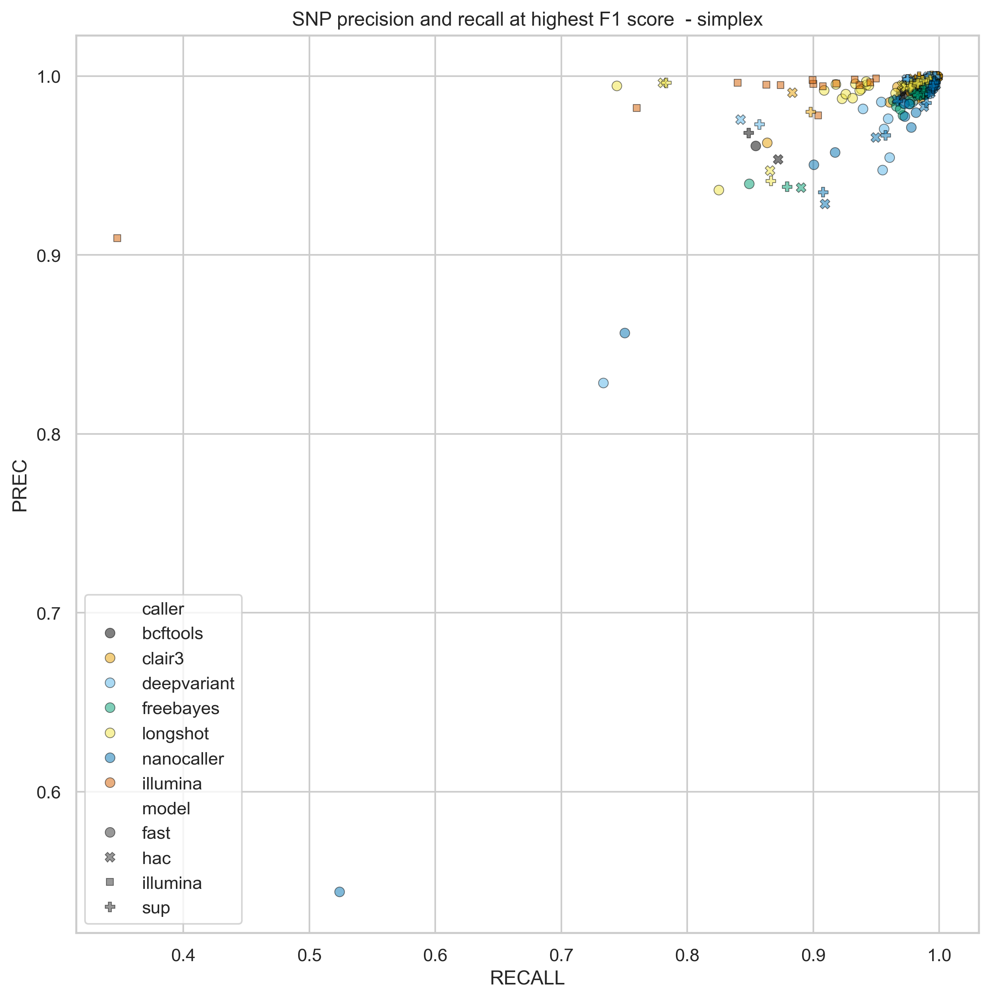

In [ ]:
vartype = "SNP"
mode = "simplex"
y = "PREC"
x = "RECALL"
hue = "caller"
marker = "model"
dataix = pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats").groupby([marker, hue, "sample"])["F1_SCORE"].idxmax()
data = pr_df.iloc[dataix]
# order = sorted(set(data[x]))
# order.insert(0, order.pop(order.index("illumina")))
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
sns.scatterplot(
    data=data,
    x=x,
    y=y,
    hue=hue,
    style=marker,
    ax=ax,
    palette=cud(),
    alpha=0.5,
    linewidth=0.5,
    edgecolor="black",
)
# ax.set_ylabel("F1 score")
# ax.set_xlabel("")
# ax.set_yscale("logit")
# ax.set_xscale("logit")
# yticks = [0.4, 0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 0.925, 0.95, 0.96, 0.97, 0.98, 0.985, 0.99, 0.9925, 0.995, 0.996, 0.997, 0.998, 0.999, 0.9995]
# ax.set_yticks(yticks)
# _ = ax.set_yticklabels([f"{yval:.2%}" for yval in yticks])
ax.set_title(f"{vartype} precision and recall at highest F1 score  - {mode}")

/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/792238250.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/792238250.py:27: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  sns.boxplot(
/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/792238250.py:40: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  sns.stripplot(
/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/792238250.py:27: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  sns.boxp

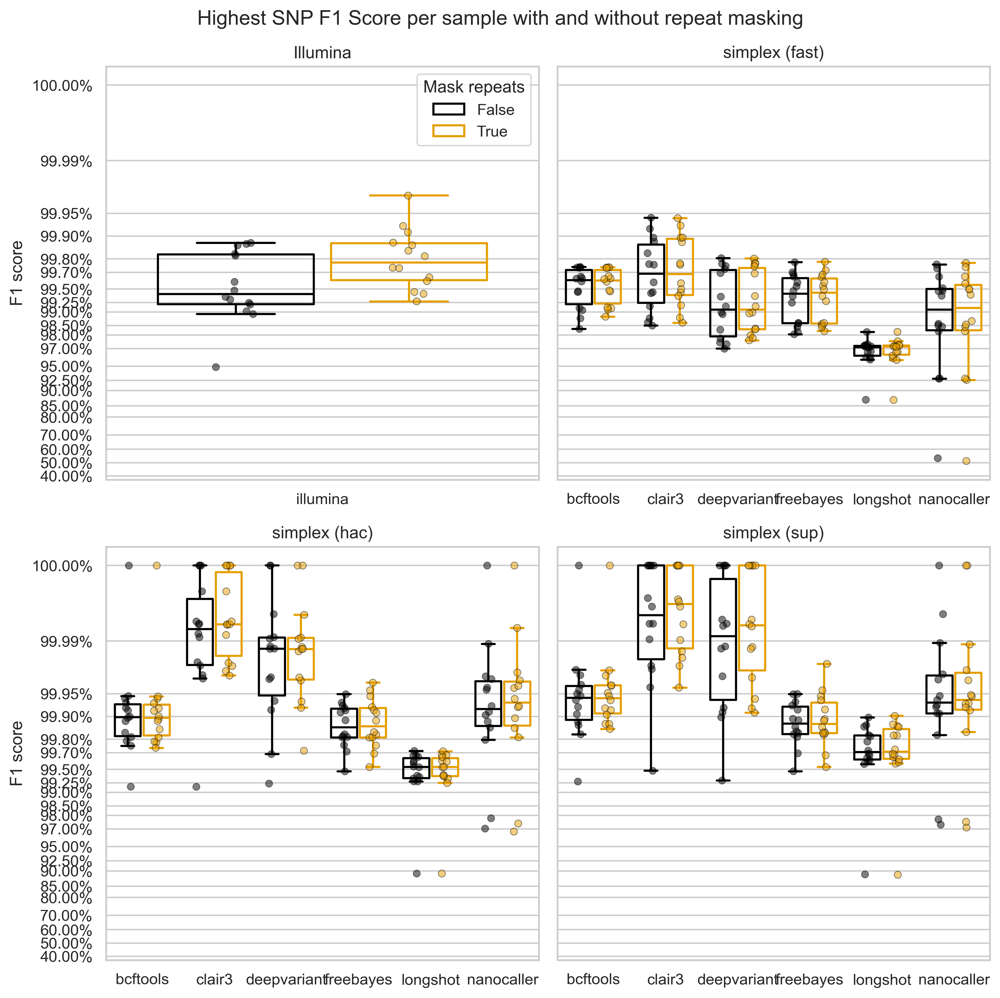

In [48]:
vartype = "SNP"
mode = "simplex"
y = "F1_SCORE"
hue = "mask_repeats"
x = "caller"
cols = "model"
dataix = pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}'").groupby([x, hue, cols, "sample"])[y].idxmax()
data = pr_df.iloc[dataix]
# transform precision so logit shows values of 1.0 - i.e. change values of 1.0 to 0.99999
cap = 0.99999
data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
# remove longshot
# data.query(f"{x} != 'longshot'", inplace=True)
# order = sorted(set(data[x]))
# order.insert(0, order.pop(order.index("illumina")))
n_rows = 2
n_cols = 2
fig, axes = plt.subplots(figsize=(10, 10), dpi=300, nrows=n_rows, ncols=n_cols, tight_layout=True, sharey=True)
models = list(data[cols].unique())
models.insert(0, models.pop(models.index("illumina")))
legend = True
for i, model in enumerate(models):
    d = data.query(f"model == '{model}'")
    ax = axes.flatten()[i]
    dodge = model != "illumina"

    sns.boxplot(
        data=d,
        x=x,
        y=y,
        # order=order,
        hue=hue,
        ax=ax,
        palette=cud(),
        fill=False,
        fliersize=0,
        legend=legend,
        gap=0.1,
    )
    sns.stripplot(
        data=d,
        x=x,
        y=y,
        # order=order,
        hue=hue,
        ax=ax,
        palette=cud(),
        alpha=0.5,
        dodge=True,
        legend=False,
        linewidth=0.5,
        edgecolor="black",
    )
    if legend:
        ax.legend(title="Mask repeats")
    
    legend = False
    ax.set_ylabel("F1 score")
    ax.set_xlabel("")
    ax.set_yscale("logit")
    yticks = [0.4, 0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 0.925, 0.95, 0.97, 0.98, 0.985, 0.99, 0.9925, 0.995, 0.997, 0.998, 0.999, 0.9995, 0.9999, cap]
    ax.set_yticks(yticks)
    _ = ax.set_yticklabels([f"{yval:.2%}" for yval in yticks])
    if model != "illumina":
        title = f"{mode} ({model})"
    else:
        title = f"Illumina"
    ax.set_title(title)
    fig.suptitle("Highest SNP F1 Score per sample with and without repeat masking")

In [19]:
dataix = pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats").groupby([x, hue, cols, "sample"])["F1_SCORE"].idxmax()
data = pr_df.iloc[dataix]
wo_mask = data.groupby(["caller", "model"])[["F1_SCORE", "PREC", "RECALL"]].describe().loc[:,(slice(None),['mean','50%'])]
wo_mask

F1_SCORE                PREC              RECALL  \
                          mean       50%      mean       50%      mean   
caller      model                                                        
bcftools    fast      0.981872  0.988344  0.991392  0.994877  0.972877   
            hac       0.987223  0.992791  0.994100  0.997046  0.980645   
            sup       0.986921  0.993217  0.994854  0.997178  0.979578   
clair3      fast      0.983352  0.989457  0.991797  0.995059  0.975365   
            hac       0.992064  0.997277  0.998505  0.999098  0.986086   
            sup       0.992836  0.997820  0.997944  0.999424  0.988003   
deepvariant fast      0.960822  0.973787  0.971211  0.985189  0.951025   
            hac       0.987320  0.994673  0.996447  0.998417  0.978948   
            sup       0.988382  0.995136  0.996680  0.998512  0.980662   
freebayes   fast      0.977397  0.984568  0.984249  0.987915  0.970917   
            hac       0.985787  0.991378  0.989434  0.993661  0.982240   
            sup       0.985491  0.991679  0.989791  0.993885  0.981343   
illumina    illumina  0.909601  0.945755  0.987665  0.995364  0.855586   
longshot    fast      0.948303  0.961086  0.988567  0.992329  0.912722   
            hac       0.974005  0.986784  0.992153  0.995643  0.958097   
            sup       0.975970  0.989203  0.992150  0.996073  0.961896   
nanocaller  fast      0.931422  0.979310  0.940791  0.981969  0.922749   
            hac       0.984630  0.994171  0.986084  0.993471  0.983217   
            sup       0.985360  0.994031  0.986944  0.993776  0.983822   

                                
                           50%  
caller      model               
bcftools    fast      0.983232  
            hac       0.988976  
            sup       0.989645  
clair3      fast      0.986079  
            hac       0.995615  
            sup       0.996738  
deepvariant fast      0.966004  
            hac       0.991325  
            sup       0.992452  
freebayes   fast      0.980813  
            hac       0.989656  
            sup       0.990303  
illumina    illumina  0.902029  
longshot    fast      0.932357  
            hac       0.978907  
            sup       0.982762  
nanocaller  fast      0.977019  
            hac       0.994413  
            sup       0.994389

In [ ]:
dataix = pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and mask_repeats").groupby([x, hue, cols, "sample"])["F1_SCORE"].idxmax()
data = pr_df.iloc[dataix]
with_mask = data.groupby(["caller", "model"])[["F1_SCORE", "PREC", "RECALL"]].describe().loc[:,(slice(None),['mean','50%'])]
with_mask

F1_SCORE                PREC              RECALL  \
                          mean       50%      mean       50%      mean   
caller      model                                                        
bcftools    fast      0.985522  0.991556  0.992086  0.994823  0.979177   
            hac       0.990744  0.994870  0.995969  0.997892  0.985692   
            sup       0.991225  0.995451  0.995975  0.997959  0.986620   
clair3      fast      0.987210  0.989956  0.991535  0.995021  0.982957   
            hac       0.996480  0.998036  0.999051  0.999466  0.993970   
            sup       0.997641  0.998594  0.999328  0.999477  0.995977   
deepvariant fast      0.959999  0.978426  0.968220  0.984811  0.952127   
            hac       0.990966  0.996401  0.997191  0.998889  0.985151   
            sup       0.992251  0.996806  0.998137  0.998949  0.986737   
freebayes   fast      0.980854  0.986073  0.986628  0.990036  0.975380   
            hac       0.988810  0.993458  0.991531  0.993982  0.986188   
            sup       0.989385  0.993880  0.992503  0.994822  0.986395   
illumina    illumina  0.932009  0.965827  0.990880  0.996435  0.890881   
longshot    fast      0.950799  0.961929  0.990369  0.993000  0.915769   
            hac       0.977007  0.989537  0.993228  0.995883  0.962814   
            sup       0.979049  0.991702  0.993821  0.996740  0.966278   
nanocaller  fast      0.928700  0.979655  0.938418  0.982963  0.919830   
            hac       0.987064  0.995243  0.988022  0.994746  0.986142   
            sup       0.988137  0.995221  0.989225  0.995118  0.987077   

                                
                           50%  
caller      model               
bcftools    fast      0.987495  
            hac       0.992004  
            sup       0.992907  
clair3      fast      0.987059  
            hac       0.996525  
            sup       0.997971  
deepvariant fast      0.972669  
            hac       0.994110  
            sup       0.994685  
freebayes   fast      0.982428  
            hac       0.992403  
            sup       0.992705  
illumina    illumina  0.937993  
longshot    fast      0.933641  
            hac       0.982785  
            sup       0.987678  
nanocaller  fast      0.977271  
            hac       0.995391  
            sup       0.995325

In [ ]:
with_mask - wo_mask

F1_SCORE                PREC              RECALL  \
                          mean       50%      mean       50%      mean   
caller      model                                                        
bcftools    fast      0.003650  0.003212  0.000694 -0.000054  0.006300   
            hac       0.003521  0.002079  0.001869  0.000846  0.005047   
            sup       0.004304  0.002234  0.001121  0.000781  0.007042   
clair3      fast      0.003859  0.000499 -0.000262 -0.000038  0.007592   
            hac       0.004416  0.000759  0.000547  0.000368  0.007884   
            sup       0.004805  0.000774  0.001383  0.000053  0.007973   
deepvariant fast     -0.000823  0.004639 -0.002991 -0.000378  0.001103   
            hac       0.003646  0.001727  0.000744  0.000471  0.006203   
            sup       0.003869  0.001669  0.001458  0.000436  0.006076   
freebayes   fast      0.003457  0.001505  0.002379  0.002121  0.004462   
            hac       0.003023  0.002080  0.002097  0.000321  0.003948   
            sup       0.003894  0.002201  0.002713  0.000937  0.005052   
illumina    illumina  0.022408  0.020072  0.003215  0.001070  0.035295   
longshot    fast      0.002496  0.000843  0.001802  0.000671  0.003047   
            hac       0.003002  0.002753  0.001075  0.000239  0.004717   
            sup       0.003080  0.002498  0.001670  0.000667  0.004382   
nanocaller  fast     -0.002722  0.000344 -0.002374  0.000994 -0.002919   
            hac       0.002434  0.001072  0.001938  0.001276  0.002924   
            sup       0.002778  0.001190  0.002281  0.001342  0.003255   

                                
                           50%  
caller      model               
bcftools    fast      0.004264  
            hac       0.003028  
            sup       0.003262  
clair3      fast      0.000981  
            hac       0.000910  
            sup       0.001233  
deepvariant fast      0.006665  
            hac       0.002785  
            sup       0.002233  
freebayes   fast      0.001615  
            hac       0.002748  
            sup       0.002402  
illumina    illumina  0.035965  
longshot    fast      0.001284  
            hac       0.003879  
            sup       0.004916  
nanocaller  fast      0.000252  
            hac       0.000978  
            sup       0.000937

/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/1479321576.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.query(f"{x} != 'longshot'", inplace=True)
/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/1479321576.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/1479321576.py:27: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  sns.boxplot(
/var/folders/b

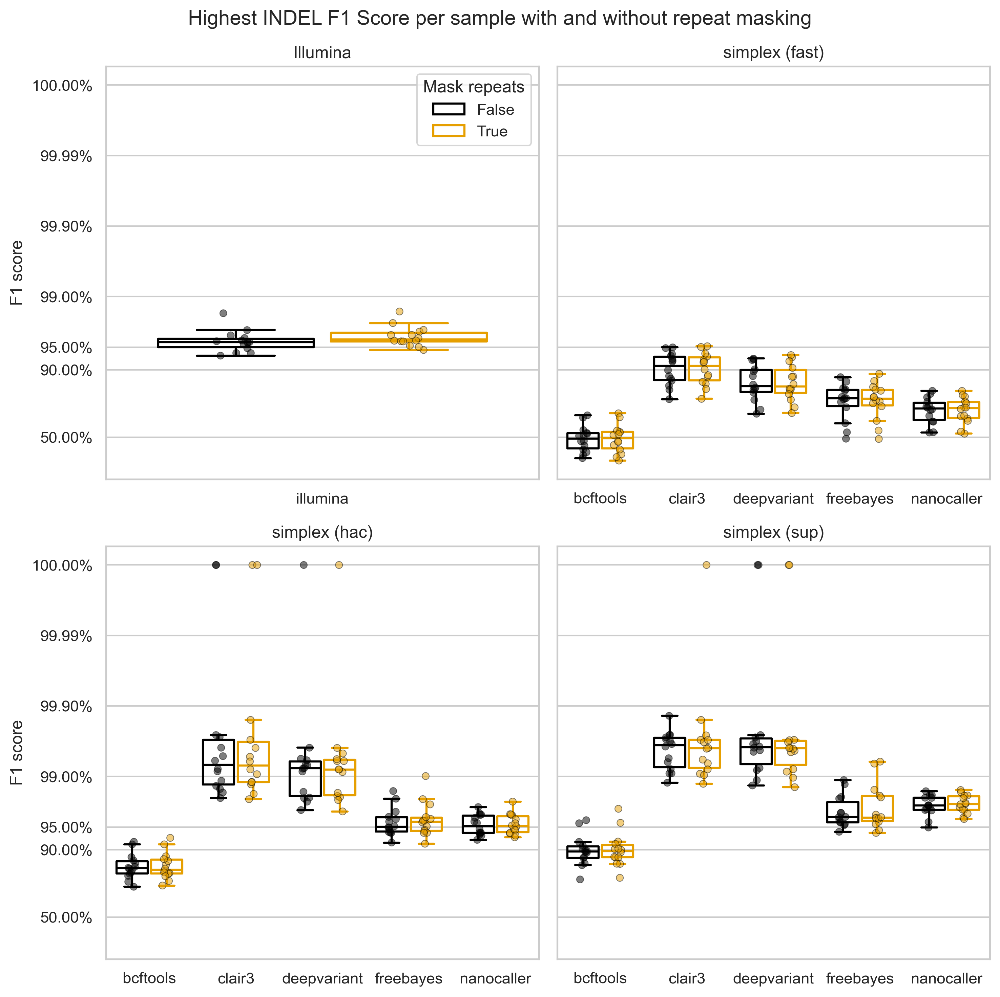

In [51]:
vartype = "INDEL"
mode = "simplex"
y = "F1_SCORE"
hue = "mask_repeats"
x = "caller"
cols = "model"
dataix = pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}'").groupby([x, hue, cols, "sample"])[y].idxmax()
data = pr_df.iloc[dataix]
# remove longshot
data.query(f"{x} != 'longshot'", inplace=True)
# transform precision so logit shows values of 1.0 - i.e. change values of 1.0 to 0.99999
cap = 0.99999
data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
# order = sorted(set(data[x]))
# order.insert(0, order.pop(order.index("illumina")))
n_rows = 2
n_cols = 2
fig, axes = plt.subplots(figsize=(10, 10), dpi=300, nrows=n_rows, ncols=n_cols, tight_layout=True, sharey=True)
models = list(data[cols].unique())
models.insert(0, models.pop(models.index("illumina")))
legend = True
for i, model in enumerate(models):
    d = data.query(f"model == '{model}'")
    ax = axes.flatten()[i]
    dodge = model != "illumina"

    sns.boxplot(
        data=d,
        x=x,
        y=y,
        # order=order,
        hue=hue,
        ax=ax,
        palette=cud(),
        fill=False,
        fliersize=0,
        legend=legend,
        gap=0.1,
    )
    sns.stripplot(
        data=d,
        x=x,
        y=y,
        # order=order,
        hue=hue,
        ax=ax,
        palette=cud(),
        alpha=0.5,
        dodge=True,
        legend=False,
        linewidth=0.5,
        edgecolor="black",
    )
    if legend:
        ax.legend(title="Mask repeats")
    
    legend = False
    ax.set_ylabel("F1 score")
    ax.set_xlabel("")
    yscale = "logit"
    yticks = [
        0.5,
        0.9,
        0.95,
        0.99,
        0.999,
        0.9999,
        cap,
    ]
    yticklabels = [f"{yval:.2%}" for yval in yticks]
    ax.set_yscale(yscale)
    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels)

    if model != "illumina":
        title = f"{mode} ({model})"
    else:
        title = f"Illumina"
    ax.set_title(title)
    fig.suptitle("Highest INDEL F1 Score per sample with and without repeat masking")

In [ ]:
dataix = pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats").groupby([x, hue, cols, "sample"])["F1_SCORE"].idxmax()
data = pr_df.iloc[dataix]
wo_mask = data.groupby(["caller", "model"])[["F1_SCORE", "PREC", "RECALL"]].describe().loc[:,(slice(None),['mean','50%'])]
wo_mask

F1_SCORE                PREC              RECALL  \
                          mean       50%      mean       50%      mean   
caller      model                                                        
bcftools    fast      0.353456  0.345201  0.584115  0.618182  0.264113   
            hac       0.614457  0.641305  0.858980  0.868191  0.492114   
            sup       0.662620  0.694030  0.914141  0.914736  0.533877   
clair3      fast      0.862569  0.873640  0.929637  0.931228  0.806366   
            hac       0.952731  0.959817  0.977948  0.984000  0.930282   
            sup       0.962782  0.966476  0.983921  0.985988  0.943474   
deepvariant fast      0.730784  0.761339  0.821504  0.797710  0.665109   
            hac       0.903571  0.915833  0.971166  0.972098  0.853526   
            sup       0.917719  0.930184  0.983159  0.988797  0.869123   
freebayes   fast      0.685436  0.713404  0.820175  0.854437  0.594888   
            hac       0.846016  0.864339  0.959041  0.966370  0.763324   
            sup       0.854491  0.876121  0.964271  0.970261  0.773865   
illumina    illumina  0.752456  0.793146  0.986706  0.988048  0.622522   
longshot    fast      0.000000  0.000000  1.000000  1.000000  0.000000   
            hac       0.000000  0.000000  1.000000  1.000000  0.000000   
            sup       0.000000  0.000000  1.000000  1.000000  0.000000   
nanocaller  fast      0.613658  0.616094  0.680041  0.681898  0.570150   
            hac       0.809781  0.836706  0.955484  0.955518  0.714214   
            sup       0.822687  0.861030  0.977065  0.974659  0.722456   

                                
                           50%  
caller      model               
bcftools    fast      0.268650  
            hac       0.508528  
            sup       0.560909  
clair3      fast      0.820601  
            hac       0.947497  
            sup       0.955310  
deepvariant fast      0.715253  
            hac       0.875189  
            sup       0.893986  
freebayes   fast      0.639385  
            hac       0.781289  
            sup       0.798629  
illumina    illumina  0.662106  
longshot    fast      0.000000  
            hac       0.000000  
            sup       0.000000  
nanocaller  fast      0.595917  
            hac       0.755249  
            sup       0.760846

In [ ]:
dataix = pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and mask_repeats").groupby([x, hue, cols, "sample"])["F1_SCORE"].idxmax()
data = pr_df.iloc[dataix]
with_mask = data.groupby(["caller", "model"])[["F1_SCORE", "PREC", "RECALL"]].describe().loc[:,(slice(None),['mean','50%'])]
with_mask

F1_SCORE                PREC              RECALL  \
                          mean       50%      mean       50%      mean   
caller      model                                                        
bcftools    fast      0.362138  0.365152  0.601432  0.628270  0.273025   
            hac       0.616656  0.651382  0.846929  0.868323  0.504159   
            sup       0.665557  0.718692  0.912929  0.928376  0.545083   
clair3      fast      0.860844  0.880027  0.921676  0.931542  0.808828   
            hac       0.953610  0.968050  0.982282  0.987372  0.928848   
            sup       0.964249  0.973426  0.986673  0.991151  0.944302   
deepvariant fast      0.727240  0.773310  0.819578  0.855527  0.663678   
            hac       0.907101  0.931254  0.972127  0.980375  0.858204   
            sup       0.923304  0.946837  0.985484  0.987393  0.876039   
freebayes   fast      0.685959  0.714434  0.817592  0.834896  0.596471   
            hac       0.855836  0.880033  0.960194  0.966549  0.777011   
            sup       0.864631  0.898334  0.967129  0.973723  0.787045   
illumina    illumina  0.786778  0.821014  0.986750  0.989374  0.669759   
longshot    fast      0.000000  0.000000  1.000000  1.000000  0.000000   
            hac       0.000000  0.000000  1.000000  1.000000  0.000000   
            sup       0.000000  0.000000  1.000000  1.000000  0.000000   
nanocaller  fast      0.614093  0.606435  0.666714  0.671990  0.577388   
            hac       0.819786  0.851709  0.954416  0.958350  0.728211   
            sup       0.832956  0.872399  0.977476  0.976478  0.736449   

                                
                           50%  
caller      model               
bcftools    fast      0.285270  
            hac       0.521836  
            sup       0.586815  
clair3      fast      0.830107  
            hac       0.959121  
            sup       0.963954  
deepvariant fast      0.698109  
            hac       0.895280  
            sup       0.914408  
freebayes   fast      0.627207  
            hac       0.809481  
            sup       0.830801  
illumina    illumina  0.700012  
longshot    fast      0.000000  
            hac       0.000000  
            sup       0.000000  
nanocaller  fast      0.602012  
            hac       0.771815  
            sup       0.779667

In [ ]:
with_mask - wo_mask

F1_SCORE                PREC              RECALL  \
                          mean       50%      mean       50%      mean   
caller      model                                                        
bcftools    fast      0.008682  0.019951  0.017317  0.010088  0.008912   
            hac       0.002199  0.010077 -0.012051  0.000132  0.012046   
            sup       0.002937  0.024662 -0.001212  0.013640  0.011206   
clair3      fast     -0.001725  0.006387 -0.007962  0.000315  0.002462   
            hac       0.000879  0.008234  0.004334  0.003372 -0.001434   
            sup       0.001468  0.006950  0.002751  0.005162  0.000828   
deepvariant fast     -0.003543  0.011971 -0.001926  0.057817 -0.001431   
            hac       0.003531  0.015421  0.000961  0.008277  0.004678   
            sup       0.005585  0.016652  0.002325 -0.001404  0.006916   
freebayes   fast      0.000523  0.001030 -0.002584 -0.019541  0.001583   
            hac       0.009820  0.015694  0.001154  0.000179  0.013687   
            sup       0.010140  0.022213  0.002858  0.003462  0.013180   
illumina    illumina  0.034322  0.027868  0.000044  0.001325  0.047238   
longshot    fast      0.000000  0.000000  0.000000  0.000000  0.000000   
            hac       0.000000  0.000000  0.000000  0.000000  0.000000   
            sup       0.000000  0.000000  0.000000  0.000000  0.000000   
nanocaller  fast      0.000435 -0.009659 -0.013327 -0.009908  0.007238   
            hac       0.010005  0.015003 -0.001068  0.002833  0.013997   
            sup       0.010269  0.011370  0.000411  0.001819  0.013993   

                                
                           50%  
caller      model               
bcftools    fast      0.016620  
            hac       0.013308  
            sup       0.025905  
clair3      fast      0.009507  
            hac       0.011624  
            sup       0.008644  
deepvariant fast     -0.017144  
            hac       0.020092  
            sup       0.020422  
freebayes   fast     -0.012178  
            hac       0.028192  
            sup       0.032171  
illumina    illumina  0.037906  
longshot    fast      0.000000  
            hac       0.000000  
            sup       0.000000  
nanocaller  fast      0.006094  
            hac       0.016566  
            sup       0.018822

/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_15698/481199379.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.sort_values(by=["caller", "MIN_QUAL"], inplace=True)
/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_15698/481199379.py:24: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  sns.lineplot(


Text(0.5, 1.0, 'KPC2__202310')

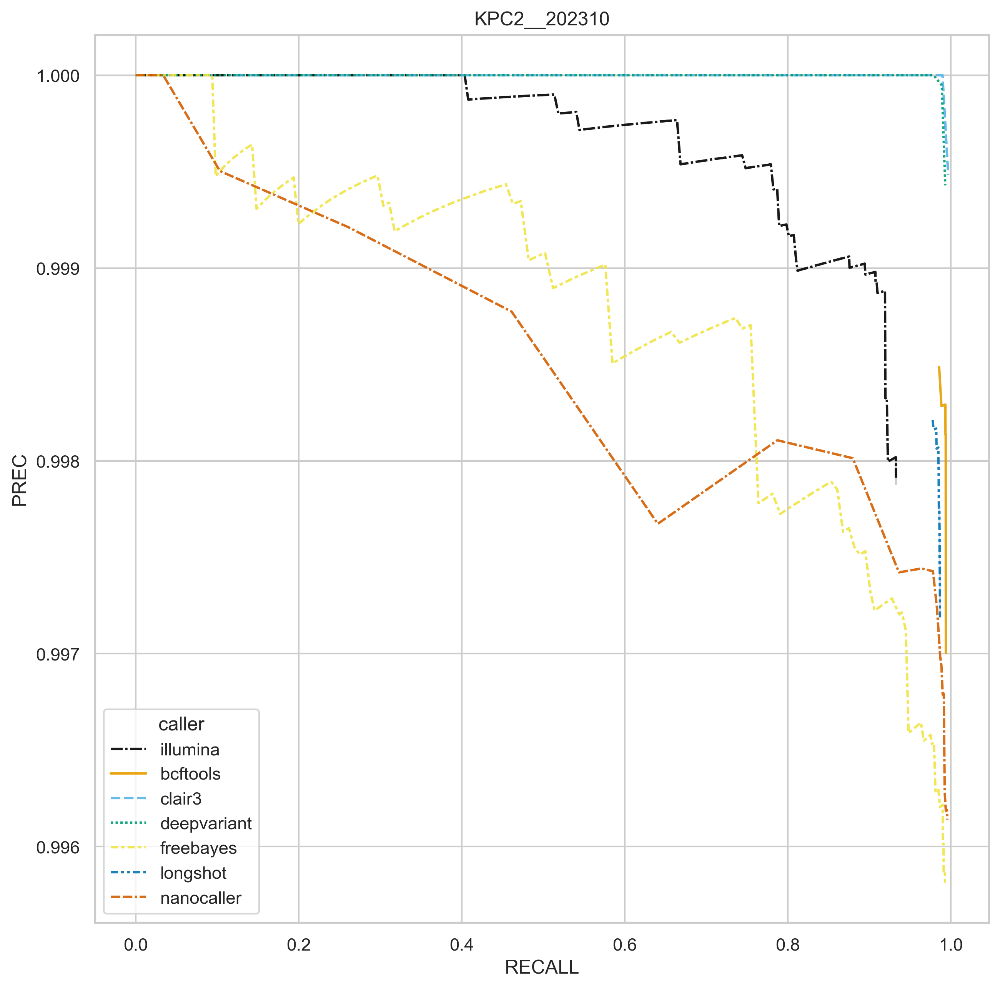

In [ ]:
vartype = "SNP"
mode = "simplex"
model = "sup"
y = "PREC"
hue = "caller"
x = "RECALL"
rows = "sample"
sample = "KPC2__202310"
samples = sorted(set(pr_df[rows]))
ncols = 2
nrows = math.ceil(len(samples) / ncols)
data = pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and model in ['illumina', '{model}'] and not mask_repeats and sample == '{sample}'")
data.sort_values(by=["caller", "MIN_QUAL"], inplace=True)
data = data.query("MIN_QUAL % 10 == 0")


# remove longshot
# data.query(f"{x} != 'longshot'", inplace=True)
hue_order = sorted(set(data[hue]))
hue_order.insert(0, hue_order.pop(hue_order.index("illumina")))

fig, ax = plt.subplots(figsize=(10, 10), dpi=300,)

sns.lineplot(
    data=data,
    x=x, 
    y=y, 
    hue=hue,
    style=hue,
    # markers=True,
    # dashes=False,
    ax=ax,
    palette=cud(),
    hue_order=hue_order,
    alpha=0.9,
)
 
ax.set_title(sample)
# ax.set_xlim((0.4, 1.01))

In [ ]:
data

,index,VAR_TYPE,MIN_QUAL,PREC,RECALL,F1_SCORE,F1_QSCORE,TRUTH_TOTAL,TRUTH_TP,TRUTH_FN,QUERY_TOTAL,QUERY_TP,QUERY_FP,sample,mask_repeats,caller,depth,mode,version,model
393992,0,SNP,0,0.997003,0.994076,0.995537,23.503946,19412,19297,115,19352,19294,58,KPC2__202310,False,bcftools,100x,simplex,v4.3.0,sup
393997,5,SNP,5,0.997106,0.994076,0.995589,23.554235,19412,19297,115,19350,19294,56,KPC2__202310,False,bcftools,100x,simplex,v4.3.0,sup
394002,10,SNP,10,0.997157,0.993973,0.995562,23.528551,19412,19295,117,19347,19292,55,KPC2__202310,False,bcftools,100x,simplex,v4.3.0,sup
394007,15,SNP,15,0.997415,0.993973,0.995691,23.656116,19412,19295,117,19342,19292,50,KPC2__202310,False,bcftools,100x,simplex,v4.3.0,sup
394012,20,SNP,20,0.997879,0.993973,0.995922,23.895685,19412,19295,117,19333,19292,41,KPC2__202310,False,bcftools,100x,simplex,v4.3.0,sup
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159800,280,SNP,280,1.000000,0.000155,0.000309,0.001342,19412,3,19409,3,3,0,KPC2__202310,False,nanocaller,100x,simplex,v4.3.0,sup
159805,285,SNP,285,1.000000,0.000155,0.000309,0.001342,19412,3,19409,3,3,0,KPC2__202310,False,nanocaller,100x,simplex,v4.3.0,sup
159810,290,SNP,290,1.000000,0.000155,0.000309,0.001342,19412,3,19409,3,3,0,KPC2__202310,False,nanocaller,100x,simplex,v4.3.0,sup
159815,295,SNP,295,1.000000,0.000155,0.000309,0.001342,19412,3,19409,3,3,0,KPC2__202310,False,nanocaller,100x,simplex,v4.3.0,sup


In [53]:
def calculate_subplot_shape(total_categories):
    # Calculate the nearest square number
    square_root = math.sqrt(total_categories)
    num_rows = math.ceil(square_root)
    num_cols = math.ceil(total_categories / num_rows)
    return num_rows, num_cols

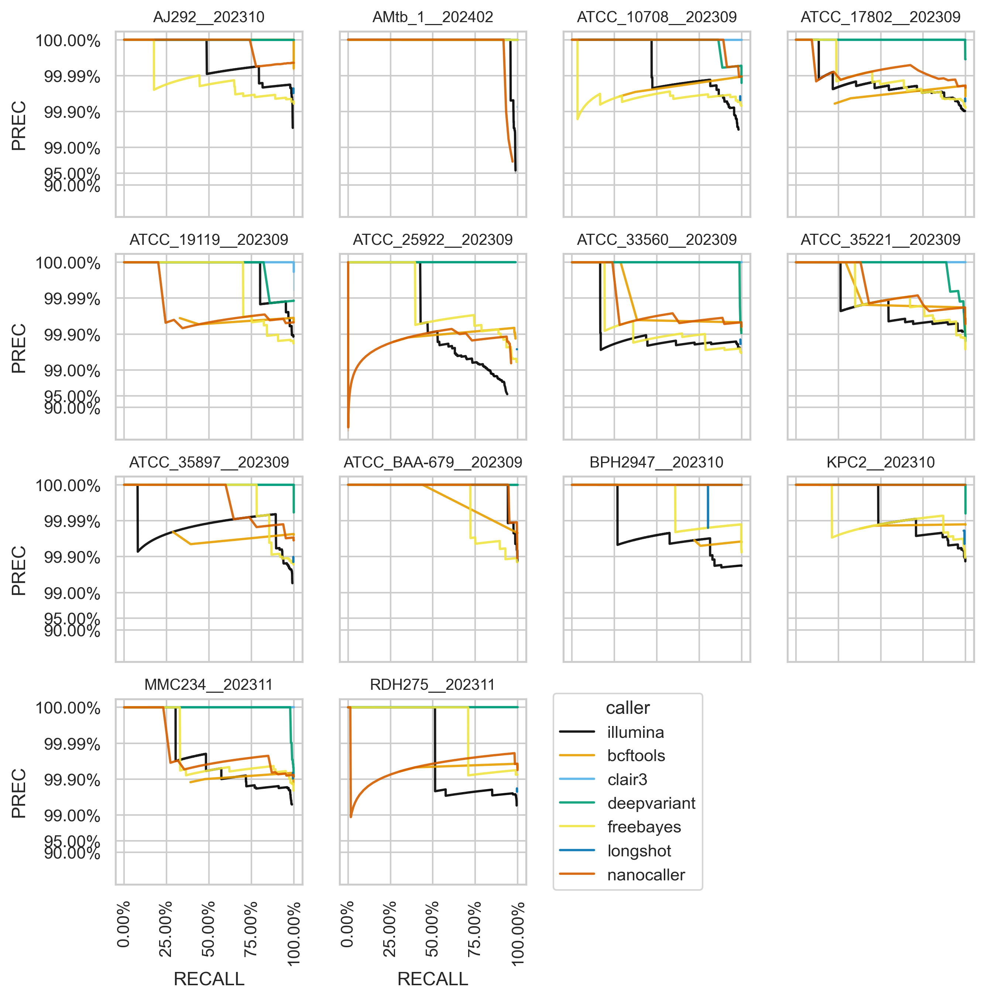

In [63]:
vartype = "SNP"
mode = "simplex"
model = "sup"
y = "PREC"
hue = "caller"
x = "RECALL"
rows = "sample"
samples = sorted(set(pr_df[rows]))
nrows, ncols = calculate_subplot_shape(len(samples))

# remove longshot
# data.query(f"{x} != 'longshot'", inplace=True)
hue_order = sorted(set(pr_df[hue]))
hue_order.insert(0, hue_order.pop(hue_order.index("illumina")))

fig, axes = plt.subplots(figsize=(10, 10), dpi=300, nrows=nrows, ncols=ncols, sharey=True, sharex=True)

legend = False
for i, sample in enumerate(samples):
    data = pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and model in ['illumina', '{model}'] and not mask_repeats and sample == '{sample}'")
    data = data.sort_values(by=["caller", "MIN_QUAL"])
    data = data.query("MIN_QUAL % 2 == 0")
    # transform precision so logit shows values of 1.0 - i.e. change values of 1.0 to 0.99999
    cap = 0.99999
    data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
    ax = axes.flatten()[i]

    if i == len(samples)-1:
        legend=True
    
    sns.lineplot(
        data=data,
        x=x, 
        y=y, 
        hue=hue,
        # style=hue,
        # markers=True,
        # dashes=False,
        ax=ax,
        palette=cud(n=len(set(data[hue]))),
        hue_order=hue_order,
        alpha=0.9,
        legend=legend,
    )

    if legend:
        sns.move_legend(ax, "center left", bbox_to_anchor=(1.1, 0.5))
    
    ax.set_title(sample, fontsize=10)
    # ax.set_ylim((0.98, 1.01))
    ax.set_yscale("logit", nonpositive="clip")
    # ax.set_xscale("logit", nonpositive="clip")
    yticks = [
        0.9,
        0.95,
        0.99,
        0.999,
        0.9999,
        cap
    ]
    yticklabels = [f"{yval:.2%}" for yval in yticks]
    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels)

    xticks = [0, 0.25, 0.5, 0.75, 1.0]
    xticklabels = [f"{xval:.2%}" for xval in xticks]
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels)
    # rotate x-axis labels
    ax.tick_params(axis="x", labelrotation=90)

fig.delaxes(axes.flatten()[-2])
fig.delaxes(axes.flatten()[-1])

In [135]:
samples = set(pr_df["sample"])
metrics = []
for vartype in ("SNP", "INDEL"):
    for mode in ("simplex", "duplex"):
        for caller in pr_df["caller"].unique():
            for model in ("sup", "hac", "fast"):
                if caller == "longshot" and vartype == "INDEL":
                    continue
                print(caller)
                if caller != "illumina":
                    data = pr_df.query(f"caller == '{caller}' and VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats and model == '{model}'")
                else:
                    data = pr_df.query(f"caller == '{caller}' and VAR_TYPE == '{vartype}' and mode == '{mode}' and not mask_repeats and model == 'illumina'")
                for q in sorted(set(data["MIN_QUAL"])):
                    if caller in ("freebays", "illumina") and q % 10 != 0:
                        continue
                    # check if every sample has this MIN_QUAL
                    subdf = data.query(f"MIN_QUAL == {q}")
                    if set(subdf["sample"]) == samples:
                        tps = subdf["TRUTH_TP"].sum()
                        fps = subdf["QUERY_FP"].sum()
                        fns = subdf["TRUTH_FN"].sum()
                        precision = tps / (tps + fps)
                        recall = tps / (tps + fns)
                        f1 = 2 * (precision * recall) / (precision + recall)
                        metrics.append((caller, q, precision, recall, f1, vartype, mode, model))



nanocaller
nanocaller
nanocaller
clair3
clair3
clair3
bcftools
bcftools
bcftools
longshot
longshot
longshot
illumina
illumina
illumina
deepvariant
deepvariant
deepvariant
freebayes
freebayes
freebayes
nanocaller
nanocaller
nanocaller
clair3
clair3
clair3
bcftools
bcftools
bcftools
longshot
longshot
longshot
illumina
illumina
illumina
deepvariant
deepvariant
deepvariant
freebayes
freebayes
freebayes
nanocaller
nanocaller
nanocaller
clair3


/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/2639861225.py:23: RuntimeWarning: invalid value encountered in scalar divide
  precision = tps / (tps + fps)


clair3
clair3
bcftools
bcftools
bcftools
illumina
illumina
illumina
deepvariant
deepvariant
deepvariant
freebayes
freebayes
freebayes
nanocaller
nanocaller
nanocaller
clair3
clair3
clair3
bcftools
bcftools
bcftools
illumina
illumina
illumina
deepvariant
deepvariant
deepvariant
freebayes
freebayes
freebayes


In [140]:
aggdf = pd.DataFrame(metrics, columns=["caller", "QUAL", "precision", "recall", "f1", "vartype", "mode", "model"])

In [141]:
aggdf.caller.unique()

array(['nanocaller', 'clair3', 'bcftools', 'longshot', 'illumina',
       'deepvariant', 'freebayes'], dtype=object)

/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/2609469447.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)


[Text(0.0, 0, '0.00%'),
 Text(0.25, 0, '25.00%'),
 Text(0.5, 0, '50.00%'),
 Text(0.75, 0, '75.00%'),
 Text(1.0, 0, '100.00%')]

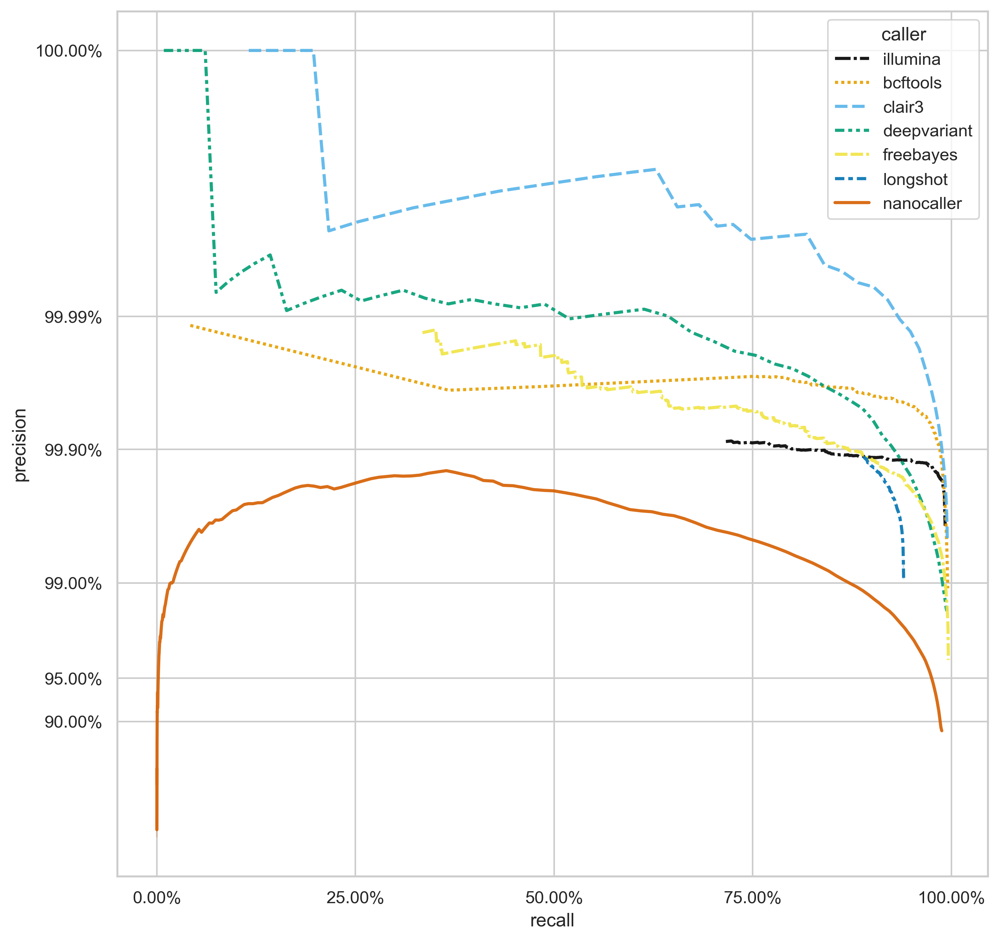

In [146]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
x = "recall"
y = "precision"
hue = "caller"
vartype = "SNP"
mode = "simplex"
model = "fast"
data = aggdf.query(f"vartype == '{vartype}' and mode == '{mode}' and model == '{model}'")
cap = 0.999999
data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
pal = cud(n=len(set(data[hue])))
hue_order = sorted(set(data[hue]))
hue_order.insert(0, hue_order.pop(hue_order.index("illumina")))
sns.lineplot(
    data=data,
    x=x,
    y=y,
    hue=hue,
    hue_order=hue_order,
    style=hue,
    ax=ax,
    palette=pal,
    alpha=0.9,
    legend="full",
    linewidth=2,
)
# sns.scatterplot(
#     data=data,
#     x=x,
#     y=y,
#     hue=hue,
#     style=hue,
#     ax=ax,
#     palette=pal,
#     alpha=0.5,
#     legend="full",
#     size=30,
#     linewidth=0,
#     hue_order=hue_order,
# )
ax.set_yscale("logit", nonpositive="clip")
# ax.set_xscale("logit", nonpositive="clip")
# ax.set_ylim(0.99, 1.001)
yticks = [
    0.9,
    0.95,
    0.99,
    0.999,
    0.9999,
    cap
]
yticklabels = [f"{yval:.2%}" for yval in yticks]
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)

xticks = [0, 0.25, 0.5, 0.75, 1.0]
xticklabels = [f"{xval:.2%}" for xval in xticks]
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
# make legend lines thicker
# for line in ax.get_legend().get_lines():
#     line.set_linewidth(3)

/var/folders/bp/zbbdn_091x1_34h2k7b9nszm0000gn/T/ipykernel_24200/792982447.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)


[Text(0.0, 0, '0.00%'),
 Text(0.25, 0, '25.00%'),
 Text(0.5, 0, '50.00%'),
 Text(0.75, 0, '75.00%'),
 Text(1.0, 0, '100.00%')]

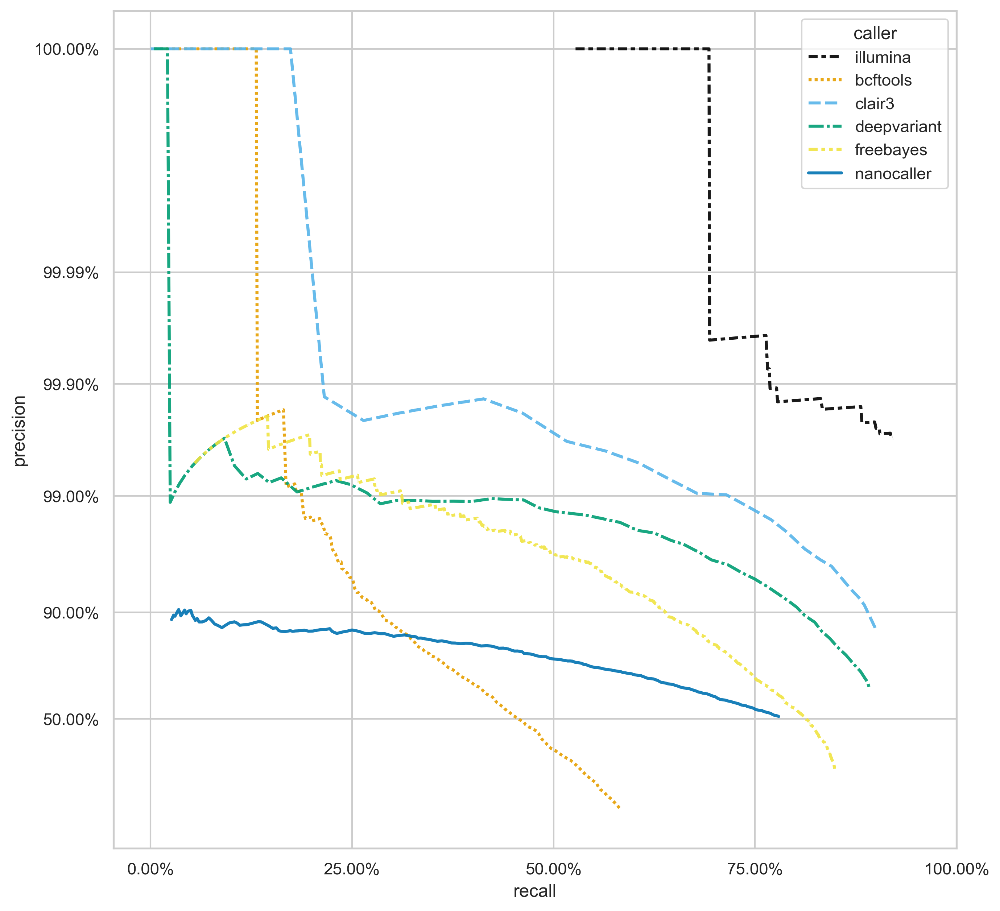

In [149]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
x = "recall"
y = "precision"
hue = "caller"
vartype = "INDEL"
mode = "simplex"
model = "fast"
data = aggdf.query(f"vartype == '{vartype}' and mode == '{mode}' and model == '{model}'")
cap = 0.999999
data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
pal = cud(n=len(set(data[hue])))
hue_order = sorted(set(data[hue]))
hue_order.insert(0, hue_order.pop(hue_order.index("illumina")))
sns.lineplot(
    data=data,
    x=x,
    y=y,
    hue=hue,
    hue_order=hue_order,
    style=hue,
    ax=ax,
    palette=pal,
    alpha=0.9,
    legend="full",
    linewidth=2,
)
# sns.scatterplot(
#     data=data,
#     x=x,
#     y=y,
#     hue=hue,
#     style=hue,
#     ax=ax,
#     palette=pal,
#     alpha=0.5,
#     legend="full",
#     size=30,
#     linewidth=0,
#     hue_order=hue_order,
# )
ax.set_yscale("logit", nonpositive="clip")
# ax.set_xscale("logit", nonpositive="clip")
# ax.set_ylim(0.99, 1.001)
yticks = [
    0.5,
    0.9,
    # 0.95,
    0.99,
    0.999,
    0.9999,
    cap
]
yticklabels = [f"{yval:.2%}" for yval in yticks]
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)

xticks = [0, 0.25, 0.5, 0.75, 1.0]
xticklabels = [f"{xval:.2%}" for xval in xticks]
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
# make legend lines thicker
# for line in ax.get_legend().get_lines():
#     line.set_linewidth(3)

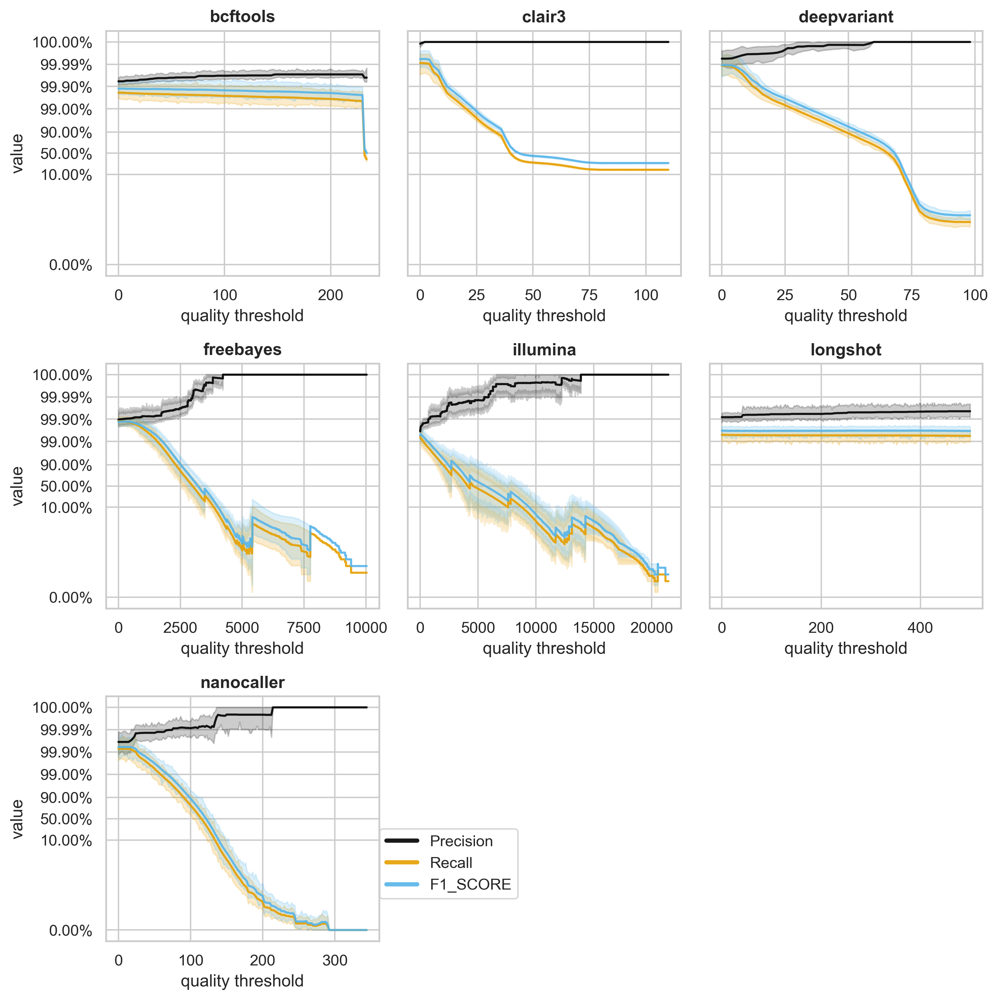

In [186]:
vartype = "SNP"
mode = "simplex"
model = "sup"
y = "value"
hue = "metric"
x = "MIN_QUAL"
rows = "caller"
callers = sorted(set(pr_df[rows]))
nrows, ncols = calculate_subplot_shape(len(callers))

# remove longshot
# data.query(f"{x} != 'longshot'", inplace=True)
# hue_order = sorted(set(pr_df[hue]))
# hue_order.insert(0, hue_order.pop(hue_order.index("illumina")))

fig, axes = plt.subplots(figsize=(10, 10), dpi=300, nrows=nrows, ncols=ncols, sharey=True, sharex=False)

legend = False
for i, caller in enumerate(callers):
    data = pr_df.query(f"VAR_TYPE == '{vartype}' and mode == '{mode}' and model in ['illumina', '{model}'] and not mask_repeats and caller == '{caller}'")
    data = data.melt(id_vars=["caller", "MIN_QUAL", "model", "sample"], value_vars=["PREC", "RECALL", "F1_SCORE"], var_name="metric", value_name="value")
    data = data.sort_values(by=["sample", "MIN_QUAL"])
    data = data.query("MIN_QUAL % 2 == 0")
    # transform precision so logit shows values of 1.0 - i.e. change values of 1.0 to 0.99999
    cap = 0.99999
    lcap = 0.00001
    data[y] = data[y].apply(lambda v: cap if v == 1.0 else v)
    data[y] = data[y].apply(lambda v: lcap if v == 0.0 else v)
    ax = axes.flatten()[i]

    # sns.scatterplot(
    #     data=data,
    #     x=x,
    #     y=y,
    #     hue=hue,
    #     ax=ax,
    #     palette=cud(n=len(set(data[hue]))),
    #     alpha=0.5,
    #     linewidth=0,
    # )

    if i == len(callers)-1:
        legend=True
    
    sns.lineplot(
        data=data,
        x=x, 
        y=y, 
        hue=hue,
        # style=hue,
        # markers=True,
        # dashes=False,
        ax=ax,
        palette=cud(n=len(set(data[hue]))),
        # hue_order=hue_order,
        alpha=0.9,
        legend=legend,
        # units="sample",
        # estimator=None,
        n_boot=100,
    )

    if legend:
        sns.move_legend(ax, "center left", bbox_to_anchor=(1.0, 0.5))
        handles, labels = ax.get_legend_handles_labels()
        ax.legend().remove()
    
    ax.set_title(caller, fontweight="bold")
    # # ax.set_ylim((0.98, 1.01))
    ax.set_yscale("logit", nonpositive="clip")
    # ax.set_xscale("symlog")
    yticks = [
        lcap,
        0.1,
        0.5,
        0.9,
        0.99,
        0.999,
        0.9999,
        cap
    ]
    yticklabels = [f"{yval:.2%}" for yval in yticks]
    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels)
    ax.set_xlabel("quality threshold")

    # xticks = [0, 0.25, 0.5, 0.75, 1.0]
    # xticklabels = [f"{xval:.2%}" for xval in xticks]
    # ax.set_xticks(xticks)
    # ax.set_xticklabels(xticklabels)
    # # rotate x-axis labels
    # ax.tick_params(axis="x", labelrotation=90)

fig.delaxes(axes.flatten()[-2])
fig.delaxes(axes.flatten()[-1])
fig.tight_layout()
# make the legend handles thicker
for handle in handles:
    handle.set_linewidth(3)
# change PREC and RECALL to Precision and Recall
labels = [label.replace("PREC", "Precision").replace("RECALL", "Recall") for label in labels]
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.45, 0.1))

In [ ]:
data

In [153]:
data.melt(id_vars=["caller", "MIN_QUAL", "model", "sample"], value_vars=["PREC", "RECALL"], var_name="metric", value_name="value")

,caller,MIN_QUAL,model,sample,metric,value
0,nanocaller,0,sup,AMtb_1__202402,PREC,0.975586
1,nanocaller,0,sup,ATCC_35897__202309,PREC,0.999646
2,nanocaller,0,sup,ATCC_25922__202309,PREC,0.993385
3,nanocaller,0,sup,MMC234__202311,PREC,0.999141
4,nanocaller,0,sup,ATCC_10708__202309,PREC,0.999894
...,...,...,...,...,...,...
4087,nanocaller,336,sup,ATCC_19119__202309,RECALL,0.000000
4088,nanocaller,338,sup,ATCC_19119__202309,RECALL,0.000000
4089,nanocaller,340,sup,ATCC_19119__202309,RECALL,0.000000
4090,nanocaller,342,sup,ATCC_19119__202309,RECALL,0.000000


# Plotting SNP density

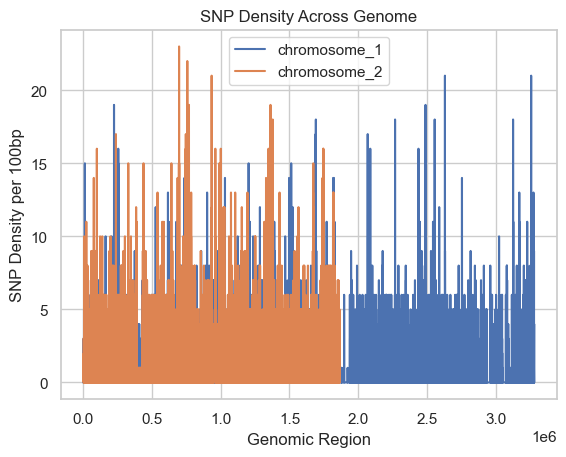

In [ ]:
import gzip
def calculate_snp_density(vcf_file, window_size=1000):
    snp_density = {}
    contigs = {}
    with gzip.open(vcf_file, mode="rt") as vcf:
        for record in vcf:
            if record[0] == "#":
                if record.startswith("##contig="):
                    l = record.split("length=")[-1].split(">")[0]
                    name = record.split("ID=")[-1].split(",")[0]
                    contigs[name] = int(l)
                    snp_density[name] = {}
                    for r in range(0, int(l), window_size):
                        snp_density[name][r] = 0
                continue
            fields = record.rstrip().split("\t")
            chrom = fields[0]
            pos = int(fields[1]) - 1
            region = pos // window_size * window_size
            if region not in snp_density[chrom]:
                raise KeyError(f"{region} not in density {snp_density[chrom]}")
            snp_density[chrom][region] += 1
    return snp_density

def plot_snp_density(snp_density, window_size):
    for chrom in snp_density:
        regions = sorted(snp_density[chrom].keys())
        densities = [snp_density[chrom][region] for region in regions]
        plt.plot(regions, densities, label=chrom)
    plt.xlabel('Genomic Region')
    plt.ylabel(f'SNP Density per {window_size}bp')
    plt.title('SNP Density Across Genome')
    plt.legend()
    plt.show()

# Example usage:
vcf_file = "../results/truth/ATCC_17802__202309/truth.vcf.gz"
w = 100
snp_density = calculate_snp_density(vcf_file, w)
plot_snp_density(snp_density, w)

In [ ]:
T = 10
for chrom, density in snp_density.items():
    for region, count in density.items():
        if count > T:
            print(chrom, region, count)

chromosome_1 82000 23
chromosome_1 82100 13
chromosome_1 161700 14
chromosome_1 204900 24
chromosome_1 222900 12
chromosome_1 223400 20
chromosome_1 223500 20
chromosome_1 223600 25
chromosome_1 224000 13
chromosome_1 224100 30
chromosome_1 224200 28
chromosome_1 227000 28
chromosome_1 227400 15
chromosome_1 227500 16
chromosome_1 230300 17
chromosome_1 231400 29
chromosome_1 231500 25
chromosome_1 231600 22
chromosome_1 231700 16
chromosome_1 250200 20
chromosome_1 250400 21
chromosome_1 250700 16
chromosome_1 250800 17
chromosome_1 251800 13
chromosome_1 251900 19
chromosome_1 253100 34
chromosome_1 253200 21
chromosome_1 253800 17
chromosome_1 433000 19
chromosome_1 433200 18
chromosome_1 746100 17
chromosome_1 1028600 15
chromosome_1 1029900 14
chromosome_1 1081900 17
chromosome_1 1082000 12
chromosome_1 1082100 21
chromosome_1 1082200 14
chromosome_1 1082300 20
chromosome_1 1082400 13
chromosome_1 1380500 22
chromosome_1 1380600 13
chromosome_1 1430300 28
chromosome_1 1439300 24
c

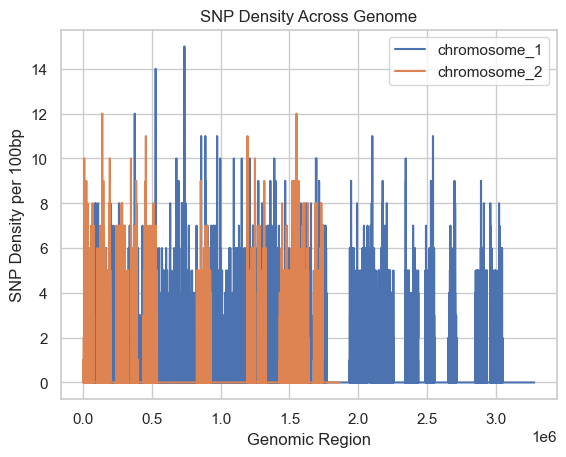

In [ ]:
vcf_file = "../tmp/ATCC_17802.vcf.gz"
snp_density = calculate_snp_density(vcf_file, w)
plot_snp_density(snp_density, w)

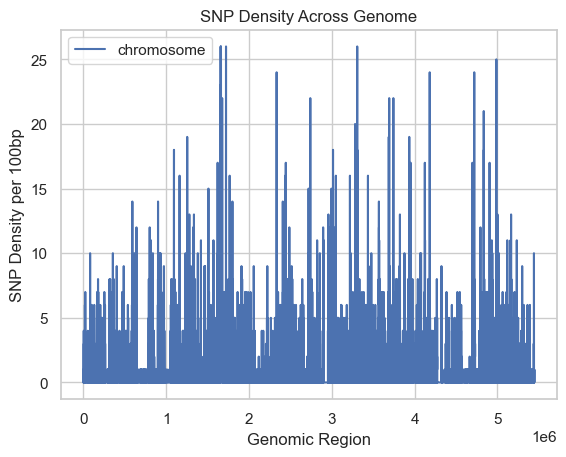

In [ ]:
vcf_file = "../results/truth/AJ292__202310/truth.vcf.gz"
snp_density = calculate_snp_density(vcf_file, w)
plot_snp_density(snp_density, w)

In [ ]:
T = 10
for chrom, density in snp_density.items():
    for region, count in density.items():
        if count > T:
            print(chrom, region, count)

chromosome 591400 14
chromosome 641000 12
chromosome 801000 12
chromosome 815800 11
chromosome 901600 14
chromosome 1093600 11
chromosome 1093800 12
chromosome 1094200 18
chromosome 1161800 16
chromosome 1254000 19
chromosome 1254100 16
chromosome 1254200 13
chromosome 1279500 13
chromosome 1325600 12
chromosome 1335400 13
chromosome 1419800 11
chromosome 1510300 15
chromosome 1570700 11
chromosome 1621200 17
chromosome 1645200 16
chromosome 1652600 12
chromosome 1652800 18
chromosome 1653800 18
chromosome 1653900 23
chromosome 1654000 21
chromosome 1654500 12
chromosome 1655800 17
chromosome 1658000 17
chromosome 1658200 26
chromosome 1658300 16
chromosome 1659600 12
chromosome 1659900 15
chromosome 1660000 22
chromosome 1660100 16
chromosome 1660400 16
chromosome 1660500 23
chromosome 1660600 17
chromosome 1661000 18
chromosome 1661100 21
chromosome 1661200 16
chromosome 1661300 20
chromosome 1661400 26
chromosome 1661500 21
chromosome 1661600 25
chromosome 1661700 18
chromosome 1661